In [1]:
import numpy as np
import matplotlib.pyplot as plt
import qcodes as qc
import qcodes.instrument_drivers.nplab_drivers as npd

In [2]:
from matplotlib.colors import SymLogNorm, LogNorm, DivergingNorm
import colorcet as cc

In [3]:
from scipy.optimize import curve_fit

In [4]:
cd ..

/Users/robertpolski/Documents/NPGroupResearch/Measurements/Triton/qcodes_data


In [5]:
qc.DataSet.default_io.base_location = '/Users/robertpolski/Documents/NPGroupResearch/Measurements/Triton/qcodes_data'

In [6]:
figfile = 'Figures/191004_M05_M08_M09_SC/'

# Device M08, contacts 38-37, the ones with a large hole pocket of SC

In [32]:
datafan1 = qc.load_data('data/2019-10-04/#040_0to8TtwodSweep_0.5nAexcM08_Rxx38-37_Rxy38-44_basetemp_19-25-12')
datafan2 = qc.load_data('data/2019-10-05/#002_8to0TtwodSweep_0.5nAexcM08_Rxx38-37_Rxy38-44_basetemp_09-35-45')

In [69]:
%matplotlib notebook

In [10]:
datafan1.triton_field_set_stable_set[:-37]

array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. , 1.1, 1.2,
       1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2. , 2.1, 2.2, 2.3, 2.4, 2.5,
       2.6, 2.7, 2.8, 2.9, 3. , 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8,
       3.9, 4. , 4.1, 4.2, 4.3])

<IPython.core.display.Javascript object>


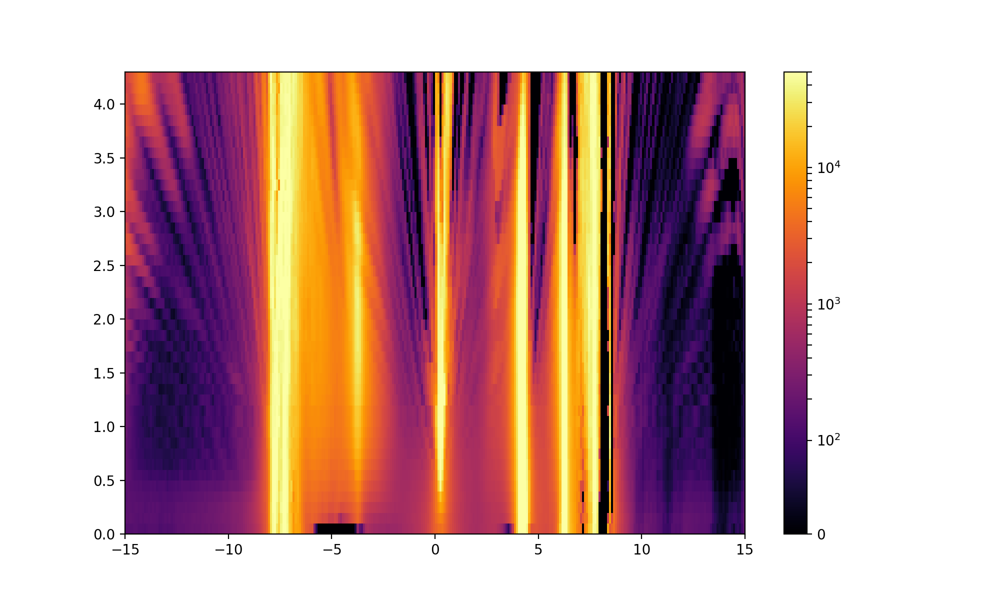

In [12]:
plt.figure(figsize=(10,6))
plt.pcolormesh(datafan1.srframe_volt_p1_set[0, :], datafan1.triton_field_set_stable_set[:-37], datafan1.lockin865_X[:-37,:]/1e-9, cmap='inferno', norm=SymLogNorm(100, vmin=0, vmax=5*10**4))
plt.colorbar()

In [15]:
datafan2.triton_field_set_stable_set[:27]

array([8. , 7.9, 7.8, 7.7, 7.6, 7.5, 7.4, 7.3, 7.2, 7.1, 7. , 6.9, 6.8,
       6.7, 6.6, 6.5, 6.4, 6.3, 6.2, 6.1, 6. , 5.9, 5.8, 5.7, 5.6, 5.5,
       5.4])

<IPython.core.display.Javascript object>


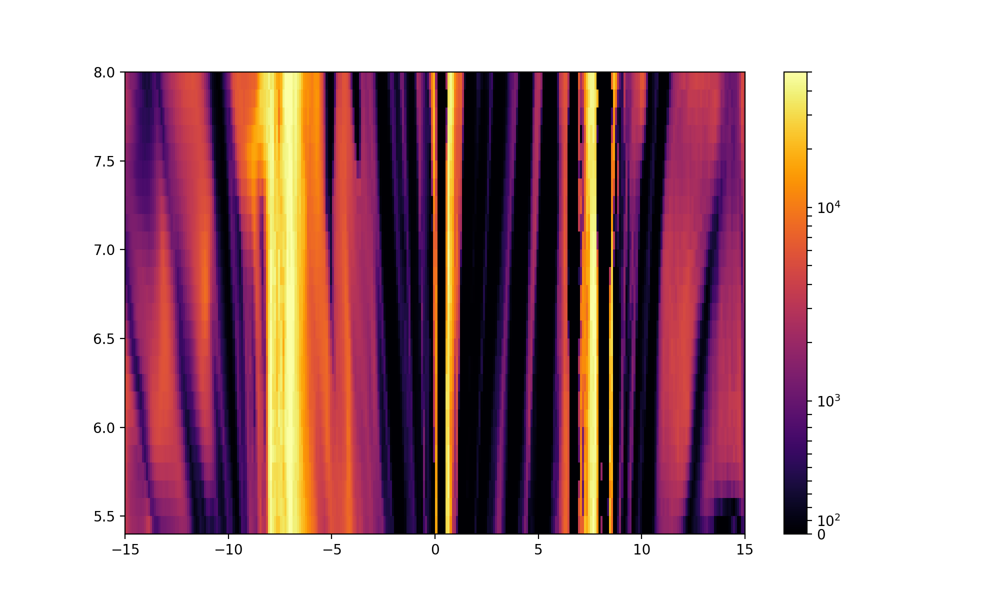

In [13]:
plt.figure(figsize=(10,6))
plt.pcolormesh(datafan2.srframe_volt_p1_set[0, :], datafan2.triton_field_set_stable_set[:27], datafan2.lockin865_X[:27,:]/1e-9, cmap='inferno', norm=SymLogNorm(1000, vmin=0, vmax=5*10**4))
plt.colorbar()

Try finding the twist angle by looking at the fans from the CNP and the full-filling bands

In [33]:

gs1 = datafan1.srframe_volt_p1_set[0, :]
Rs1 = datafan1.lockin865_X[:, :]/0.5e-9

gs2 = datafan2.srframe_volt_p1_set[0, :]
Rs2 = datafan2.lockin865_X[:, :]/0.5e-9

<IPython.core.display.Javascript object>


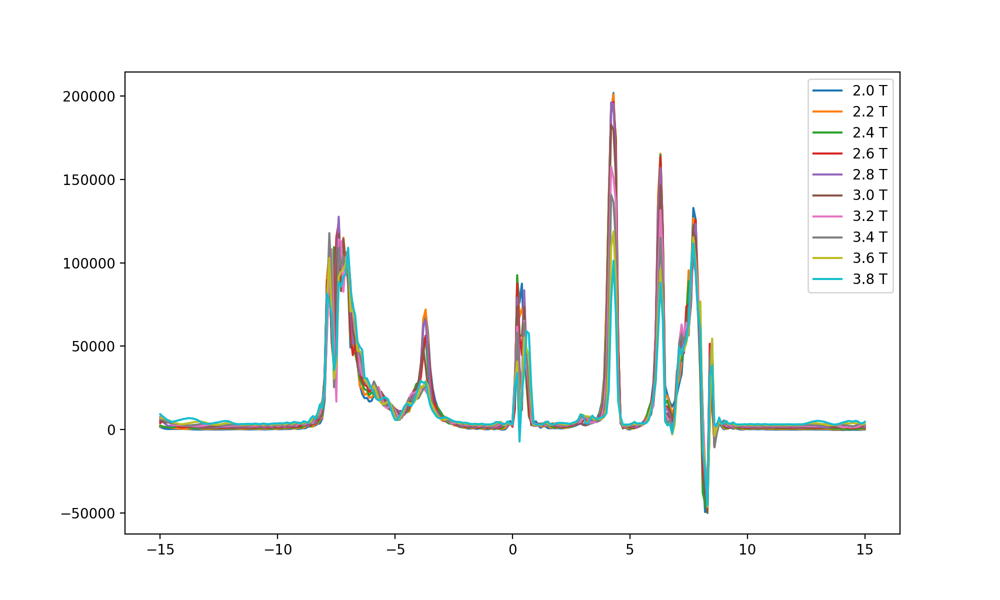

In [15]:
plt.figure(figsize=(10,6))
for i in range(10):
    plt.plot(gs1, Rs1[20+2*i, :]+350*i, label='{:.1f} T'.format(datafan1.triton_field_set_stable_set[20+2*i]))
plt.legend()

In [9]:
# hole side of the CNP
vs1 = [-0.374, -0.398, -0.423, -0.472, -0.503, -0.552, -0.589, -0.632, -0.651, -0.681, -0.706, -0.743, -0.768, -0.804, -0.835, -0.872, -0.909, -0.934, -0.964, -0.989, -1.89, -1.95, -2.02, -2.08, -2.16, -2.27, -2.32, -2.40, -2.42, -2.51]
Bs1 = np.concatenate((np.linspace(2, 3.9, 20), np.linspace(6.2, 8, 10)))

vshalf = [-0.813, -0.835, -0.867, -0.921, -0.943, -0.964, -1.01, -1.05, -1.07, -1.09]
Bshalf = np.linspace(6.2, 8, 10)

vs2 = [-0.792, -0.82, -0.88, -0.946, -0.995, -1.051, -1.088, -1.149, -1.217, -1.266, -1.321, -1.371, -1.432, -1.475, -1.549, -1.586, -1.654, -1.678, -1.734, -1.783]
Bs2 = np.linspace(2, 3.9, 20)

vs3 = [-1.08, -1.137, -1.223, -1.284, -1.364, -1.444, -1.487, -1.555, -1.617, -1.703]
Bs3 = np.linspace(2, 2.9, 10)

vstot = np.concatenate((vs1, vs2, vs3, vshalf))
Bstot = np.concatenate((Bs1*4, Bs2*6, Bs3*8, Bshalf*2))

sl, b = np.polyfit(vstot, Bstot, 1)

In [10]:
print(sl, b)

-11.09489539598033 3.831927327596076


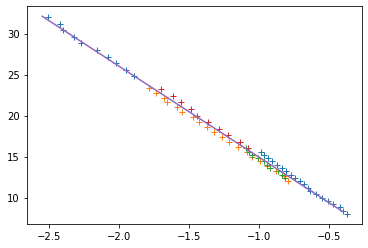

In [11]:
plt.figure()
plt.plot(vs1, Bs1*4, '+')
plt.plot(vs2, Bs2*6, '+')
plt.plot(vshalf, Bshalf*2, '+')
plt.plot(vs3, Bs3*8, '+')
xfit = np.array([-2.55, -0.4])
plt.plot(xfit, sl*xfit+b)

In [12]:
C = -sl*1.602e-19**2/6.626e-34
dBN = 3*8.85e-12/C
V0 = -b/sl
print('effective hBN thickness: {:.1f} nm'.format(dBN*10**9))
print('V0: ', V0)

effective hBN thickness: 61.8 nm
V0:  0.34537750837960846


In [13]:
# outside of full filling hole side
vsf1 = [-8.488, -8.534, -8.632, -8.684, -8.731, -8.783, -8.870, -8.939, -9.009, -9.032, -9.816, -9.87, -9.93, -9.99, -10.07, -10.14, -10.23, -10.29, -10.41, -10.51]
Bsf1 = np.concatenate((np.array([2, 2.2, 2.4, 2.6, 2.8, 3, 3.2, 3.4, 3.6, 3.8]), np.linspace(6.2, 8, 10)))

vs1andhalf = [-11.97, -12.13, -12.25, -12.35, -12.41, -12.58, -12.83, -12.99, -13.13, -13.32]
Bs1andhalf = np.linspace(6.2, 8, 10)

vsf2 = [-9.866, -10.046, -10.254, -10.428, -10.648, -10.851, -11.031, -11.233, -11.500, -11.679]
Bsf2 = np.array([2, 2.2, 2.4, 2.6, 2.8, 3, 3.2, 3.4, 3.6, 3.8])

vsf3 = [-11.662, -11.905, -12.155, -12.456, -12.682, -12.989]
Bsf3 = np.array([2.8, 3, 3.2, 3.4, 3.6, 3.8])

vsftot = np.concatenate((vsf1, vs1andhalf, vsf2, vsf3))
Bsftot = np.concatenate((Bsf1*4, Bs1andhalf*8, Bsf2*12, Bsf3*16))

slf, bf = np.polyfit(vsftot, Bsftot, 1)

In [14]:
print(slf, bf)

-11.684640404016196 -90.57221927031419


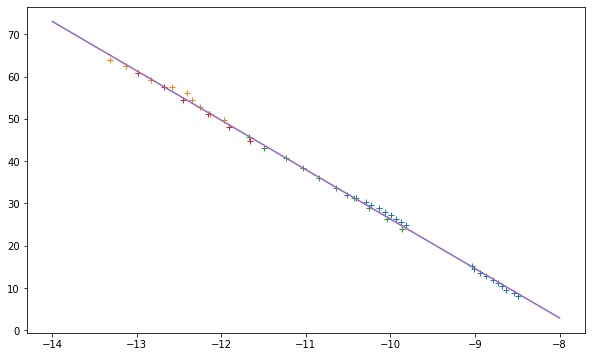

In [15]:
plt.figure(figsize=(10,6))
plt.plot(vsf1, Bsf1*4, '+')
plt.plot(vs1andhalf, Bs1andhalf*8, '+')
plt.plot(vsf2, Bsf2*12, '+')
plt.plot(vsf3, Bsf3*16, '+')
xfitf = np.array([-14, -8])
plt.plot(xfitf, slf*xfitf + bf)

In [16]:
V0fullh = -bf/slf
print(V0fullh)

-7.751391240006247


In [18]:
print('Vgatefull = ', str(V0 - V0fullh))
nfull = (V0 - V0fullh)*C/1.602e-19/10**4
print(nfull/10**12) #10**12 cm^-2
a = 0.246e-9

theta = np.sqrt(np.sqrt(3)*nfull*10**4*a**2/8)*180/np.pi
print('theta: ', theta)

Vgatefull =  8.096768748385855
2.1719310186941057
theta:  0.9665316357706051


<IPython.core.display.Javascript object>


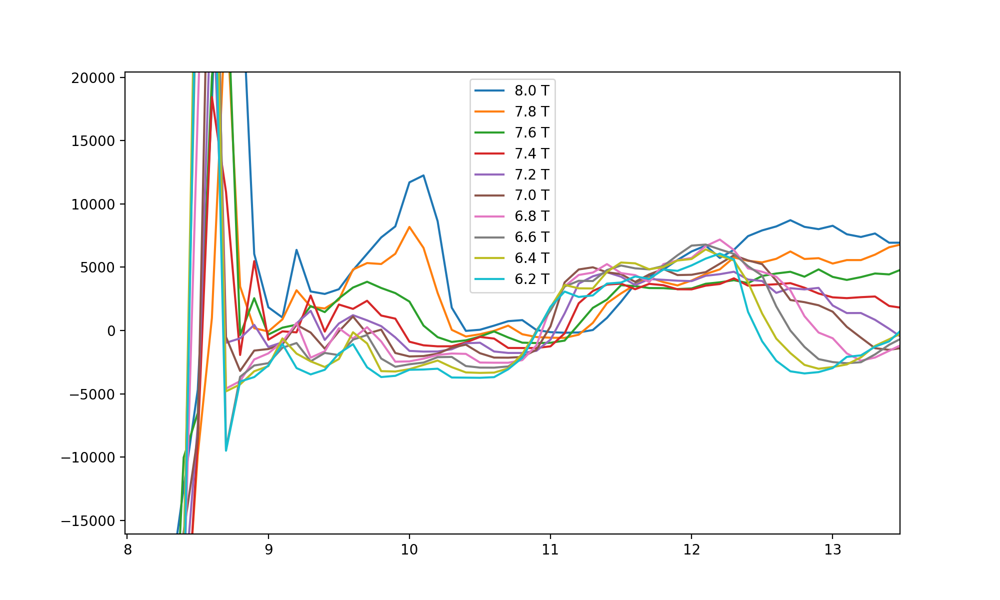

In [8]:
plt.figure(figsize=(10,6))
for i in range(10):
    plt.plot(gs2, Rs2[2*i, :]-400*i, label='{:.1f} T'.format(datafan2.triton_field_set_stable_set[2*i]))
plt.legend()

Plot the partial fan that we have so far

In [21]:
zspace = np.zeros((10, len(datafan1.srframe_volt_p1_set[0, :])))

In [22]:
partialfan = np.vstack((Rs2[:27], zspace, np.flip(Rs1[:-37, :], axis=0)))

In [23]:
pfan = np.nan_to_num(np.flip(partialfan, axis=0))

In [24]:
pfan.shape

(81, 301)

In [25]:
fields = np.linspace(0, 8, 81) # T
gates = gs1

<IPython.core.display.Javascript object>


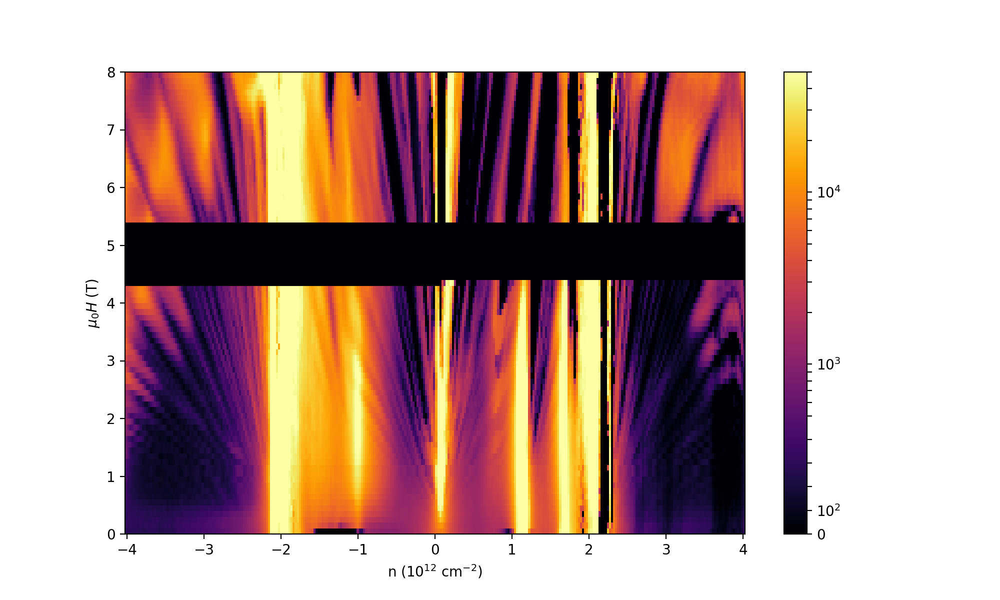

Text(0, 0.5, '$\\mu_0 H$ (T)')

In [31]:
plt.figure(figsize=(10,6))
plt.pcolormesh(gates*C/1.602e-19/10**16, fields, pfan, cmap='inferno', norm=SymLogNorm(500, vmin=0, vmax=5*10**4))
plt.colorbar()
plt.xlabel('n (10$^{12}$ cm$^{-2}$)')
plt.ylabel('$\mu_0 H$ (T)')

In [135]:
# plt.savefig(figfile+'partialfan', dpi=400)

# Complete landau fan diagram, both Rxx and Rxy

In [23]:
sl, b = -11.09489539598033, 3.831927327596076
C = -sl*1.602e-19**2/6.626e-34
dBN = 3*8.85e-12/C
V0 = -b/sl
V0 -= 0.015
Vgatefull = 8.096768748385855
print('effective hBN thickness: {:.1f} nm'.format(dBN*10**9))
print('V0: ', V0)

nfull = (V0 - V0fullh)*C/1.602e-19/10**4
print(nfull/10**12) #10**12 cm^-2
a = 0.246e-9

theta = np.sqrt(np.sqrt(3)*nfull*10**4*a**2/8)*180/np.pi
print('theta: ', theta)

effective hBN thickness: 61.8 nm
V0:  0.33037750837960844
2.167907319080984
theta:  0.9656359268823933


In [24]:
datafan = qc.load_data('data/2019-10-06/#003_0to8TtwodSweep_0.5nAexcM08_Rxx38-37_Rxy38-44_basetemp_161fieldpts_16-35-30')

Rxxfan = datafan.lockin865_X[:, :]/0.5e-9
Rxyfan = datafan.lockin830_X[:, :]/0.5e-9
gfan = datafan.srframe_volt_p1_set[0, :]
fieldsfan = datafan.triton_field_set_stable_set[:]

Text(0, 0.5, '$\\mu_0 H$ (T)')

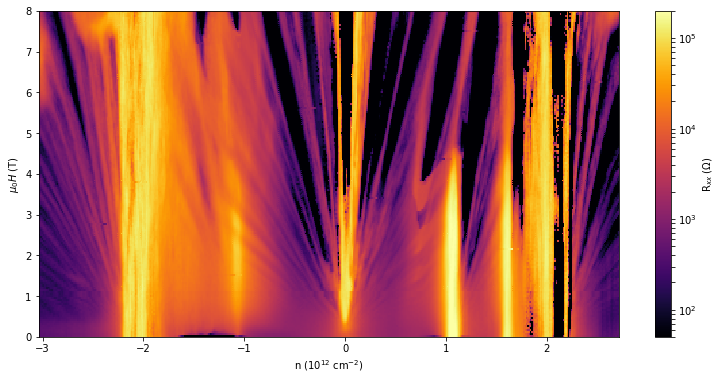

In [25]:
plt.figure(figsize=(13,6))  # artificially cut off max in Rxx
plt.pcolormesh((gfan[11:]-V0)*C/1.602e-19/10**16, fieldsfan, Rxxfan[:, 11:], norm=SymLogNorm(10, vmin=50, vmax=2e5), cmap='inferno')
plt.colorbar(label='R$_{xx}$ ($\Omega$)')
plt.xlabel('n (10$^{12}$ cm$^{-2}$)')
plt.ylabel('$\mu_0 H$ (T)')
# plt.savefig(figfile+'M08_38-37_FullLandauFan_Rxx', dpi=350)

In [18]:
%matplotlib widget

Text(0, 0.5, '$\\mu_0 H$ (T)')

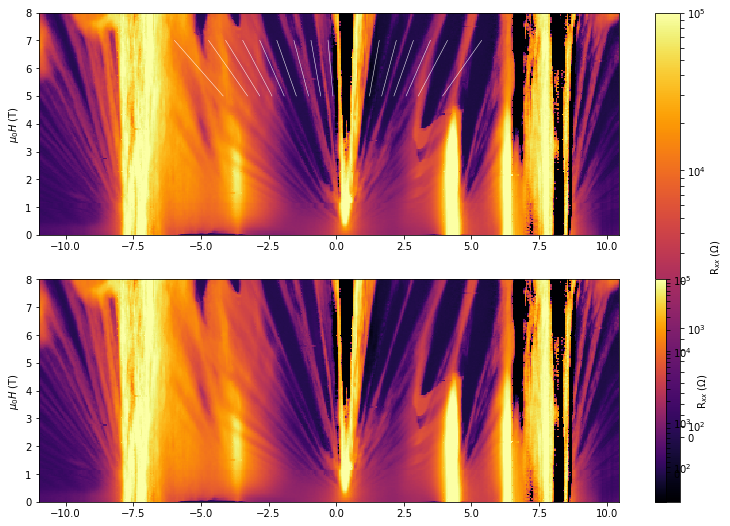

In [26]:
fig, ax = plt.subplots(2,1, figsize=(13,9))  # artificially cut off max in Rxx
p1 = ax[0].pcolormesh(gfan[11:], fieldsfan, Rxxfan[:, 11:], norm=SymLogNorm(1000, vmin=-600, vmax=1e5), cmap='inferno')
plt.colorbar(p1, ax=ax, label='R$_{xx}$ ($\Omega$)')
# plt.xlabel('n (10$^{12}$ cm$^{-2}$)')
ax[0].set_ylabel('$\mu_0 H$ (T)')

Bl = 7
Bs = 5
b = -V0*sl*-1

for i in [-10, -8, -7, -6, -5, -4, -3, -2, -1, 2, 3, 4, 5, 6, 8]:
    x = np.array([(Bs*i - b)/-sl, (Bl*i - b)/-sl])
    ax[0].plot(x, (x*-sl + b)/i, color='white', lw=0.5)
    
# # negative full filling
# Vfn = V0 - Vgatefull
# bfn = -Vfn*sl

# for i in [-9, -7, -5, 2, 4, 6, 8]:
#     x = np.array([(Bs*i - bfn)/sl, (Bl*i - bfn)/sl])
#     ax.plot(x, (x*sl + bfn)/i, color='white', lw=0.5)

p2 = ax[1].pcolormesh(gfan[11:], fieldsfan, Rxxfan[:, 11:], norm=SymLogNorm(1000, vmin=-600, vmax=1e5), cmap='inferno')
plt.colorbar(p2, ax=ax[1], label='R$_{xx}$ ($\Omega$)')
# plt.xlabel('n (10$^{12}$ cm$^{-2}$)')
ax[1].set_ylabel('$\mu_0 H$ (T)')


<IPython.core.display.Javascript object>


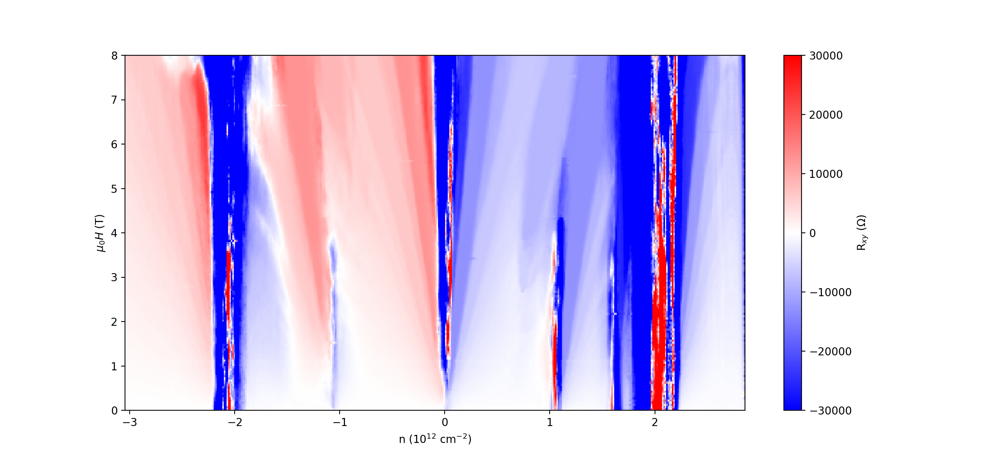

In [90]:
plt.figure(figsize=(13,6))
plt.pcolormesh((gfan-V0)*C/1.602e-19/10**16, fieldsfan, Rxyfan, cmap='bwr', vmin=-3e4, vmax=3e4)
plt.colorbar(label='R$_{xy}$ ($\Omega$)')
plt.xlabel('n (10$^{12}$ cm$^{-2}$)')
plt.ylabel('$\mu_0 H$ (T)')
# plt.savefig(figfile+'M08_38-37_FullLandauFan_Rxy', dpi=350)

<IPython.core.display.Javascript object>


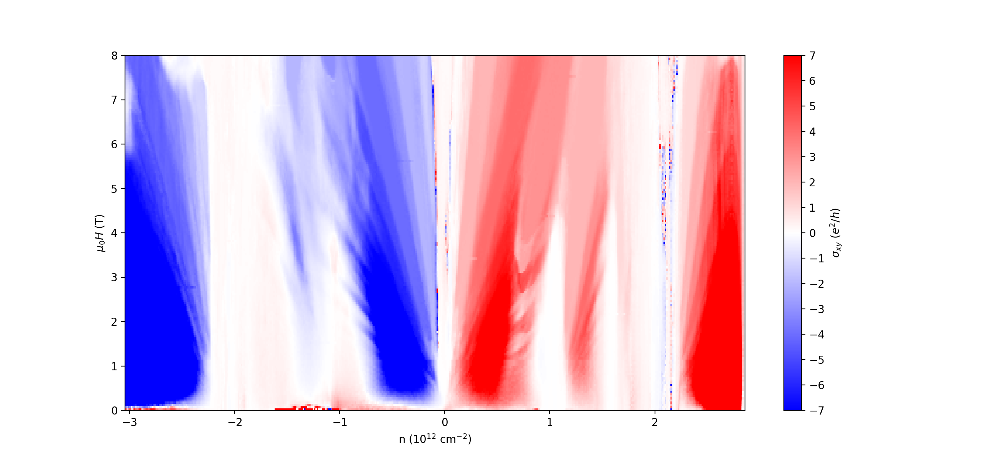

Text(0, 0.5, '$\\mu_0 H$ (T)')

In [28]:
sigmaxy = -Rxyfan/(Rxyfan**2 + Rxxfan**2)
plt.figure(figsize=(13,6))
plt.pcolormesh((gfan-V0)*C/1.602e-19/10**16, fieldsfan, sigmaxy/(1.602e-19**2/6.6e-34), cmap='bwr', vmin=-7, vmax=7)
plt.colorbar(label='$\sigma_{xy}$ ($e^2/h$)', ticks=np.linspace(-7, 7, 15))
plt.xlabel('n (10$^{12}$ cm$^{-2}$)')
plt.ylabel('$\mu_0 H$ (T)')
# plt.savefig(figfile+'M08_38-37_FullLandauFan_Sigmaxy', dpi=350)

<IPython.core.display.Javascript object>


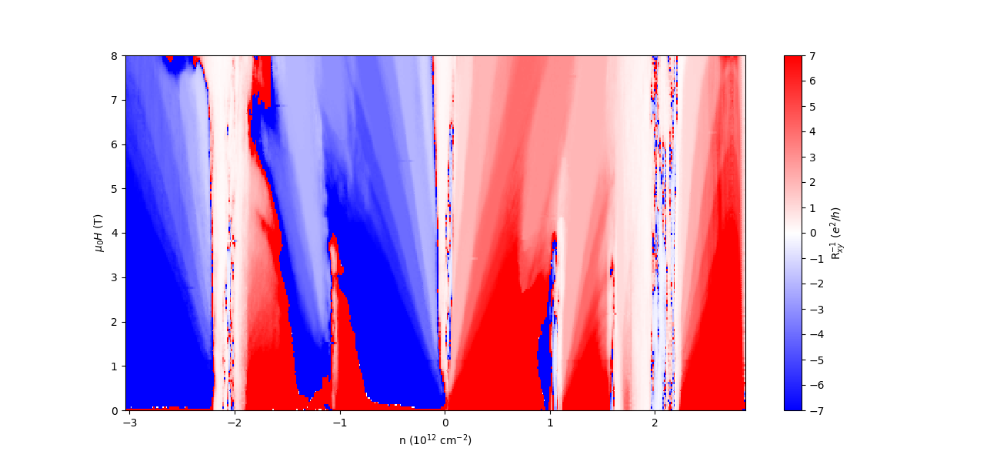

/Users/robertpolski/anaconda/envs/qcodes/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in true_divide
  


Text(0, 0.5, '$\\mu_0 H$ (T)')

In [69]:
plt.figure(figsize=(13,6))
plt.pcolormesh((gfan-V0)*C/1.602e-19/10**16, fieldsfan, -1/Rxyfan/(1.602e-19**2/6.6e-34), cmap='bwr', vmin=-7, vmax=7)
plt.colorbar(label='R$_{xy}^{-1}$ ($e^2/h$)', ticks=np.linspace(-7, 7, 15))
plt.xlabel('n (10$^{12}$ cm$^{-2}$)')
plt.ylabel('$\mu_0 H$ (T)')
# plt.savefig(figfile+'M08_38-37_FullLandauFan_InvRxy', dpi=350)

In [73]:
fieldsfan[140]

7.0

<IPython.core.display.Javascript object>


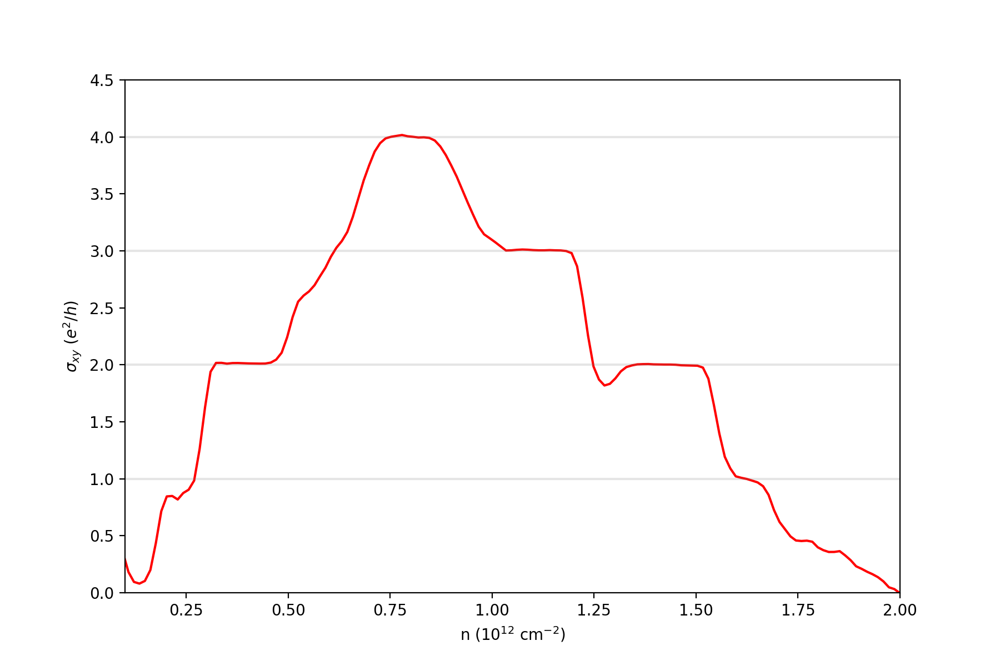

[0.1, 2, 0, 4.5]

In [29]:
  # 7T cut, 
nav = 3
plt.figure(figsize=(9, 6))
plt.plot(npd.mov_average((gfan-V0)*C/1.602e-19/10**16, nav), npd.mov_average(sigmaxy[-1, :]/(1.602e-19**2/6.6e-34), nav), 'r', label='8 T')
# plt.plot(gfan*C/1.602e-19/nfull/10**4, sigmaxy[140, :]/(1.602e-19**2/6.6e-34), label='7 T')
# plt.plot(gfan*C/1.602e-19/nfull/10**4, sigmaxy[80, :]/(1.602e-19**2/6.6e-34), label='4 T')
for i in np.linspace(1, 4, 4):
    plt.axhline(y=i, color='gray', alpha=0.2)
    
plt.ylabel('$\sigma_{xy}$ $(e^2/h)$')
plt.xlabel('n (10$^{12}$ cm$^{-2}$)')

plt.axis([0.1, 2, 0, 4.5])
# plt.savefig(figfile+'M08_electronsidequantization8T', dpi=300)

<IPython.core.display.Javascript object>


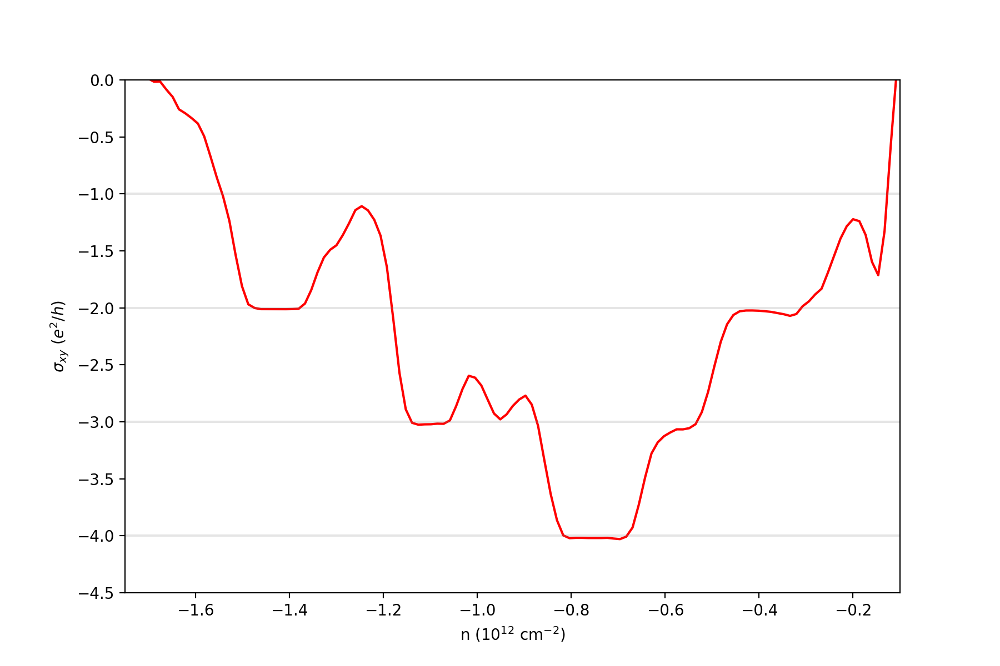

[-1.75, -0.1, -4.5, 0]

In [30]:
nav = 3
plt.figure(figsize=(9, 6))
plt.plot(npd.mov_average((gfan-V0)*C/1.602e-19/10**16, nav), npd.mov_average(sigmaxy[-1, :]/(1.602e-19**2/6.6e-34), nav), 'r', label='8 T')
# plt.plot(gfan*C/1.602e-19/nfull/10**4, sigmaxy[140, :]/(1.602e-19**2/6.6e-34), label='7 T')
# plt.plot(gfan*C/1.602e-19/nfull/10**4, sigmaxy[80, :]/(1.602e-19**2/6.6e-34), label='4 T')
for i in np.linspace(1, 4, 4):
    plt.axhline(y=-1*i, color='gray', alpha=0.2)
    
plt.ylabel('$\sigma_{xy}$ $(e^2/h)$')
plt.xlabel('n (10$^{12}$ cm$^{-2}$)')

plt.axis([-1.75, -0.1, -4.5, 0])
# plt.savefig(figfile+'M08_holesidequantization', dpi=300)

# Temperature dependence

In [7]:
def Rxxfromdata(dset, current, instrument='lockin865'):
    X = getattr(dset, str(instrument) + '_X')[:]/current
    Y = getattr(dset, str(instrument) + '_Y')[:]/current
    R = np.sqrt(X**2 + Y**2)
    
    if len(X.shape) == 1:
        for i, r in enumerate(R):
            if r > 5*10**4:
                X[i] = r
    elif len(X.shape) == 2:
        for j in range(R.shape[0]):
            for i, r in enumerate(R[j, :]):
                if r > 5*10**4:
                    X[j, i] = r
        
    return X

In [8]:
Tdata = qc.load_data('data/2019-10-10/#006_M08_-.8mT_0.2nA_T-bgtwod_11-08-50')
Tdata

DataSet:
   location = 'data/2019-10-10/#006_M08_-.8mT_0.2nA_T-bgtwod_11-08-50'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (30,)
   Setpoint | srframe_volt_p1_set     | volt_p1      | (30, 401)
   Measured | lockin830_X             | X            | (30, 401)
   Measured | lockin830_Y             | Y            | (30, 401)
   Measured | lockin865_X             | X            | (30, 401)
   Measured | lockin865_Y             | Y            | (30, 401)

In [9]:
baseTdata = qc.load_data('data/2019-10-10/#003_M08_38-37_basetemp_-.08mT_0.2nA_09-02-47')

In [10]:
baseTdata

DataSet:
   location = 'data/2019-10-10/#003_M08_38-37_basetemp_-.08mT_0.2nA_09-02-47'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (401,)
   Measured | lockin830_X         | X            | (401,)
   Measured | lockin830_Y         | Y            | (401,)
   Measured | lockin865_X         | X            | (401,)
   Measured | lockin865_Y         | Y            | (401,)

In [11]:
# 1-2K data
T12_0 = qc.load_data('data/2019-10-16/#005_M08_-.8mT_0.2nA_T-bgtwod_1p1to1p3K_16-39-57') #1.1-1.3
T12_1 = qc.load_data('data/2019-10-16/#003_M08_-.8mT_0.2nA_T-bgtwod_1p4to1p9K_14-36-33') #1.4-1.5
T12_2 = qc.load_data('data/2019-10-16/#004_M08_-.8mT_0.2nA_T-bgtwod_1p6to1p9K_15-21-10') #1.6-1.9

midT = np.arange(1.1, 1.7, 0.1)
R3837_m = np.vstack((T12_0.lockin865_X[:, :], T12_1.lockin865_X[:2, :], T12_2.lockin865_X[:-3, :]))/0.2e-9  # don't include the last few points since they were taken when the temperature was likely higher
R3837_m_2 = np.vstack((Rxxfromdata(T12_0, 0.2e-9, 'lockin865'), Rxxfromdata(T12_1, 0.2e-9, 'lockin865')[:2, :], Rxxfromdata(T12_2, 0.2e-9, 'lockin865')[:-3, :]))

In [12]:
Tdata.triton_pid_setpoint_set

DataArray[30]: triton_pid_setpoint_set
array([0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 , 0.55,
       0.6 , 0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95, 1.  , 1.05,  nan,
        nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan])

In [13]:
T = np.concatenate(([0.025], Tdata.triton_pid_setpoint_set[:20]))
Tgates = Tdata.srframe_volt_p1_set[0, :]
R3837 = np.vstack((baseTdata.lockin865_X[:], Tdata.lockin865_X[:20, :]))/0.2e-9
R3837_2 = np.vstack((Rxxfromdata(baseTdata, 0.2e-9, 'lockin865'), Rxxfromdata(Tdata, 0.2e-9, 'lockin865')[:20, :]))

In [14]:
T

array([0.025, 0.05 , 0.1  , 0.15 , 0.2  , 0.25 , 0.3  , 0.35 , 0.4  ,
       0.45 , 0.5  , 0.55 , 0.6  , 0.65 , 0.7  , 0.75 , 0.8  , 0.85 ,
       0.9  , 0.95 , 1.   ])

In [15]:
R3837

array([[3613.91812475,  742.1067494 ,  519.0833008 , ...,  704.6222805 ,
         688.52365585,  529.4023353 ],
       [ 430.82948764,  455.77536411,  398.41584254, ...,  637.44280965,
         603.3619826 ,  451.84268771],
       [ 464.48747071,  406.41445765,  471.71290873, ...,  643.8809663 ,
         654.3101705 ,  487.5398929 ],
       ...,
       [ 473.3828618 ,  449.06439456,  492.82188997, ..., 1048.1691959 ,
         906.67583665,  851.93939015],
       [ 445.74576918,  479.60618587,  503.0272021 , ..., 1079.0260063 ,
         980.81081035,  844.56267755],
       [ 498.40249261,  500.57451515,  483.27148505, ..., 1044.4598786 ,
         950.4065446 ,  871.80104915]])

In [16]:
T

array([0.025, 0.05 , 0.1  , 0.15 , 0.2  , 0.25 , 0.3  , 0.35 , 0.4  ,
       0.45 , 0.5  , 0.55 , 0.6  , 0.65 , 0.7  , 0.75 , 0.8  , 0.85 ,
       0.9  , 0.95 , 1.   ])

<IPython.core.display.Javascript object>


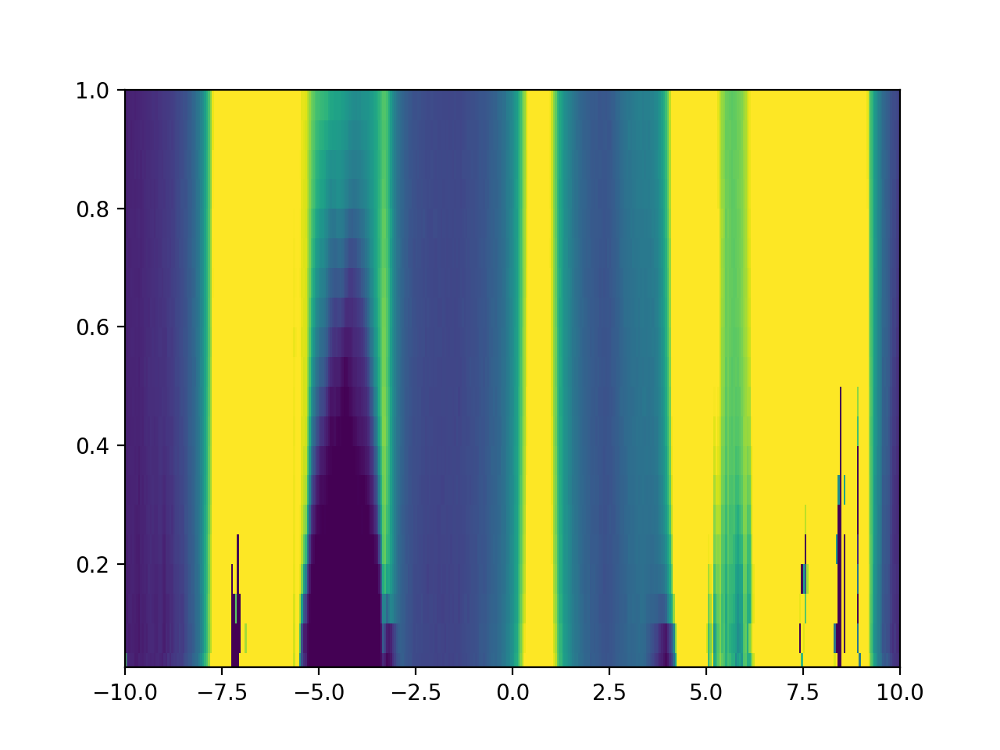

In [19]:
plt.figure()
plt.pcolormesh(Tgates, T, R3837, vmax=5000, vmin=0)

Hole Pocket

<IPython.core.display.Javascript object>


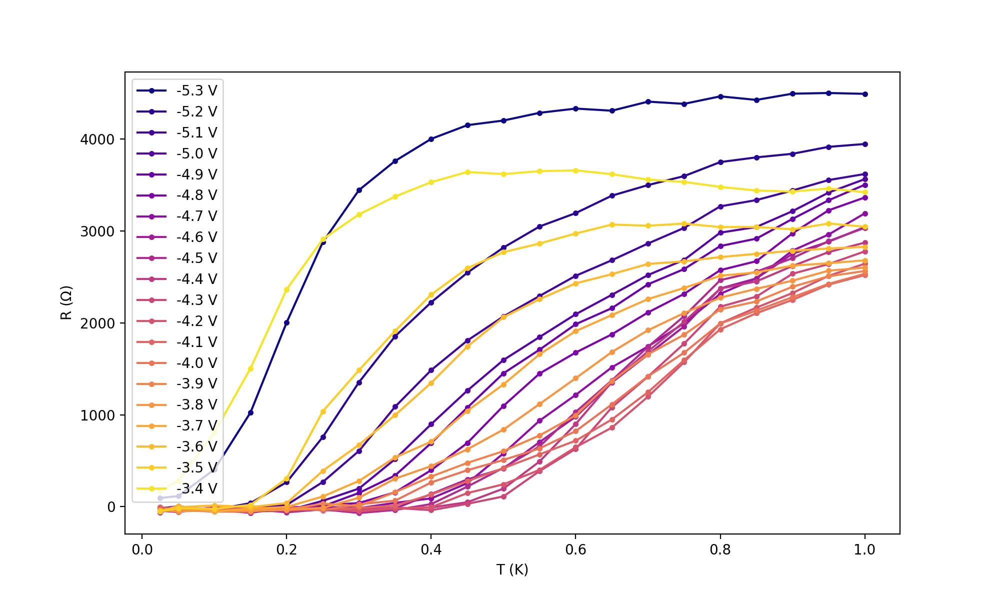

In [42]:
N = 20
cs = plt.get_cmap('plasma')([i/N for i in range(N)])
plt.figure(figsize=(10, 6))
for i in range(N):
    gv = 94 + 2*i
    plt.plot(T, R3837[:, gv], '.-', color=cs[i], label='{} V'.format(Tgates[gv]))

plt.xlabel('T (K)')
plt.ylabel('R ($\Omega$)')
plt.legend()
# plt.savefig(figfile + 'M08_SCTdependence_to1K_somegates', dpi=300)

Now 2-10K

In [20]:
dHT2 = qc.load_data('data/2019-10-11/#001_M08_-.8mT_0.2nA_T-bgtwod_7p2to10K_08-58-32')
dHT1 = qc.load_data('data/2019-10-10/#007_M08_-.8mT_0.2nA_T-bgtwod_3to10K_17-35-51')  #actually 2-10K

In [21]:
dHT1.triton_pid_setpoint_set[50]  #last full temp data point

7.0

In [22]:
R3837_h1 = dHT1.lockin865_X[:51, :]/0.2e-9
hT1 = dHT1.triton_pid_setpoint_set[:51]
Tgates = dHT1.srframe_volt_p1_set[0, :]

R3837_h2 = dHT2.lockin865_X[:, :]/0.2e-9
hT2 = dHT2.triton_pid_setpoint_set[:]

In [23]:
R3837_h1_2 = Rxxfromdata(dHT1, 0.2e-9, 'lockin865')[:51, :]

R3837_h2_2 = Rxxfromdata(dHT2, 0.2e-9, 'lockin865')

<IPython.core.display.Javascript object>


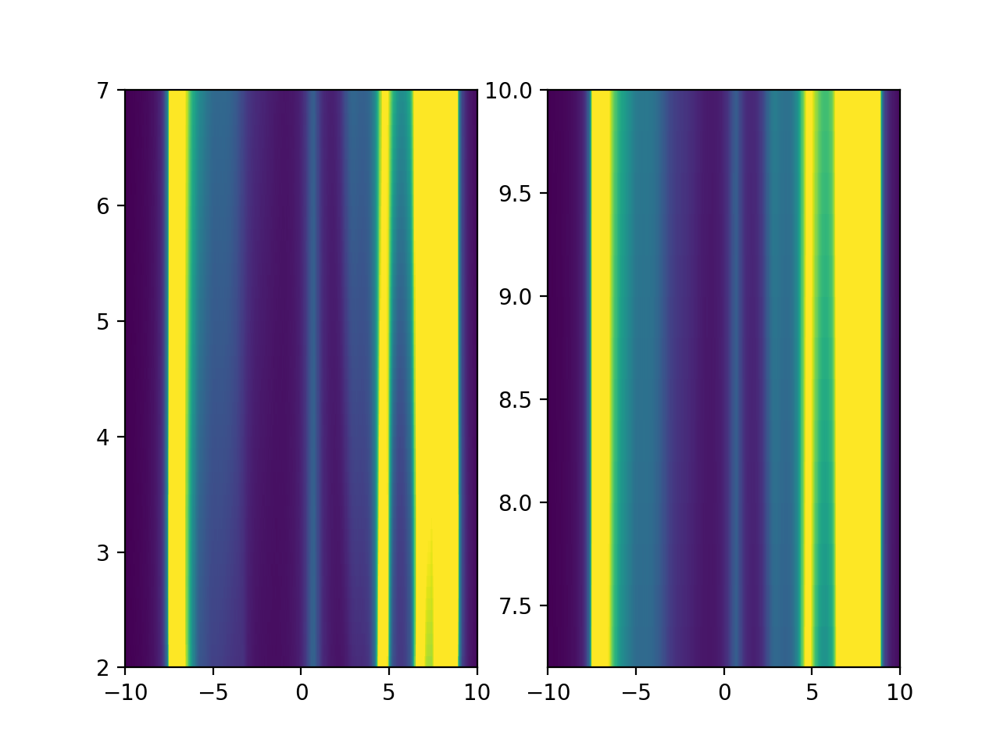

In [47]:
fig, ax = plt.subplots(1, 2)
ax[0].pcolormesh(Tgates, hT1, R3837_h1, vmax=20000)
ax[1].pcolormesh(Tgates, hT2, R3837_h2, vmax=20000)

In [24]:
# combine them

R3837_H = np.vstack((R3837_h1, R3837_h2[1:, :]))
hT = np.concatenate((hT1, hT2[1:]))

R3837_H_2 = np.vstack((R3837_h1_2, R3837_h2_2[1:, :]))

<IPython.core.display.Javascript object>


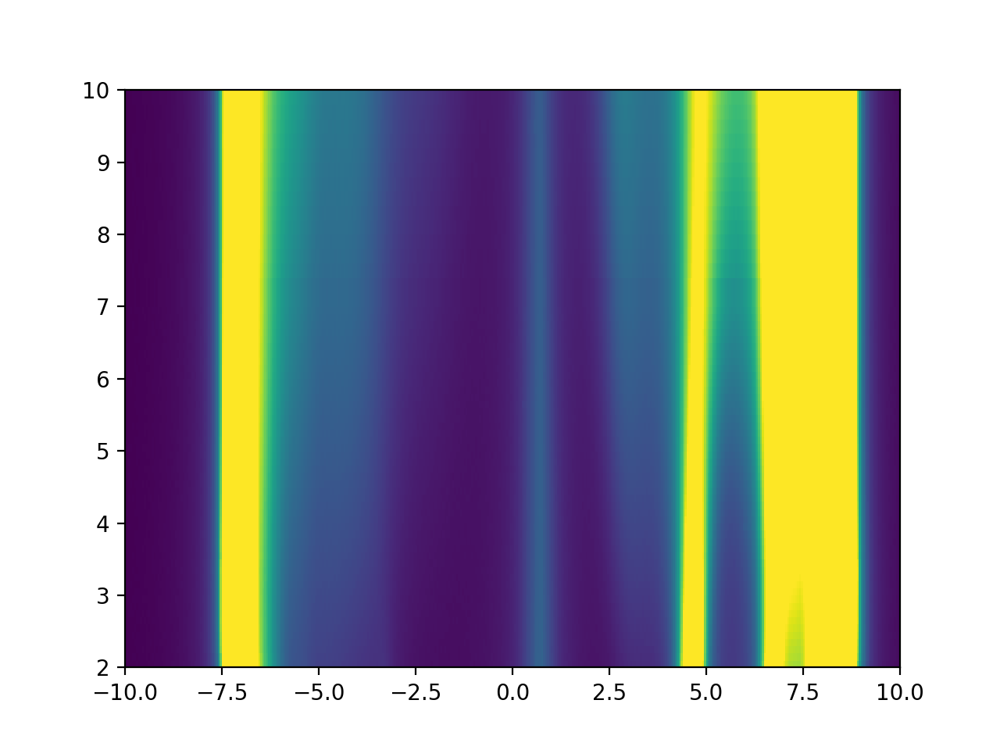

In [49]:
plt.figure()
plt.pcolormesh(Tgates, hT, R3837_H, vmax=20000)

In [25]:
# Combine with the low-temp data
R3837_all = np.vstack((R3837, R3837_m, R3837_H))
Tall = np.concatenate((T, midT, hT))

R3837_all_2 = np.vstack((R3837_2, R3837_m_2, R3837_H_2))

<IPython.core.display.Javascript object>


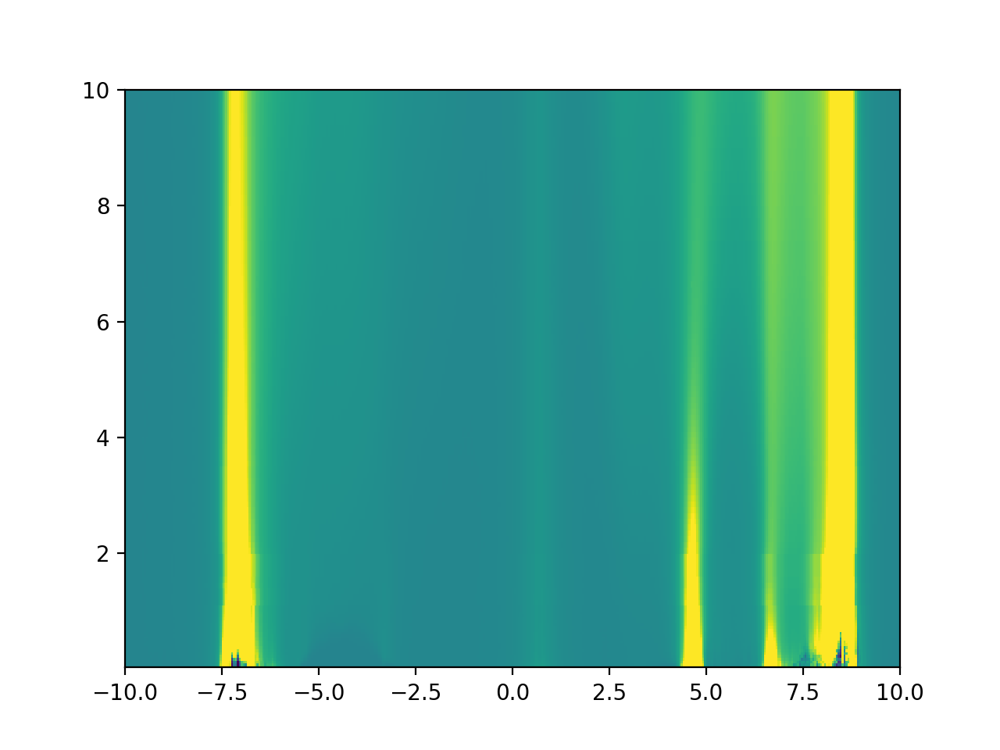

In [51]:
plt.figure()
plt.pcolormesh(Tgates, Tall, R3837_all, vmax=50000)

In [52]:
Tgates[114]

-4.3

<IPython.core.display.Javascript object>


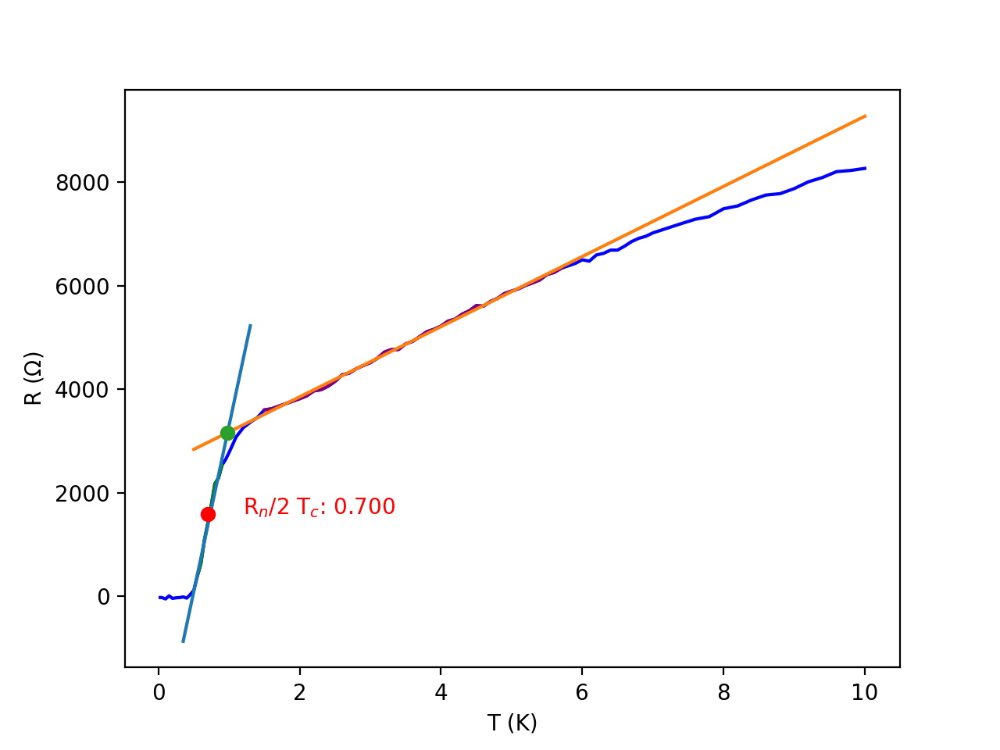

-4.3
1580.8342189975529
1580.83 is not a value in the array
Plotted 1415.83 instead
Rn/2 SC Tc: 0.700


Text(0, 0.5, 'R ($\\Omega$)')

In [53]:
N = 20
cs = plt.get_cmap('plasma')([i/N for i in range(N)])
plt.figure()
# for i in range(9, 20):
#     gv = 88 + 2*i
#     plt.plot(Tall, R3837_all[:, gv], color=cs[i], label='{} V'.format(Tgates[gv]))
g = 114
print(Tgates[g])
plt.plot(Tall, R3837_all[:, g], color='blue', label='{} V'.format(Tgates[g]))
plt.plot(Tall[11:19], R3837_all[11:19, g], color='green', label='{} V'.format(Tgates[g]))
plt.plot(Tall[25:65], R3837_all[25:65, g], color='purple', label='{} V'.format(Tgates[g]))
l1p = np.polyfit(Tall[11:19], R3837_all[11:19, g], 1)
l2p = np.polyfit(Tall[25:65], R3837_all[25:65, g], 1)
x1 = np.array([0.35, 1.3])
x2 = np.array([0.5, 10])
plt.plot(x1, l1p[0]*x1 + l1p[1])
plt.plot(x2, l2p[0]*x2 + l2p[1])

# find the intercept:
Tint = (l1p[1] - l2p[1])/(l2p[0] - l1p[0])
Rint = l2p[0]*Tint + l2p[1]
plt.plot(Tint, Rint, 'o')
print(Rint/2)
Ro2ind = npd.val_to_index([Rint/2], R3837_all[:, g])
Tc = Tall[Ro2ind[0]]
print('Rn/2 SC Tc: {:.3f}'.format(Tc))
plt.plot(Tc, Rint/2, 'or')
plt.text(Tc + 0.5, Rint/2, 'R$_n$/2 T$_c$: {:.3f}'.format(Tc), color='red')
plt.xlabel('T (K)')
plt.ylabel('R ($\Omega$)')
# plt.savefig(figfile + 'M08_-4p8Vbg_SCTcMeasurement', dpi=300)
# plt.legend()

In [54]:
Rint

3161.6684379951057

In [55]:
npd.val_to_index([Rint/2], R3837_all[:, g])

1580.83 is not a value in the array
Plotted 1415.83 instead


[14]

In [56]:
2750/2

1375.0

Electron Pocket

<IPython.core.display.Javascript object>


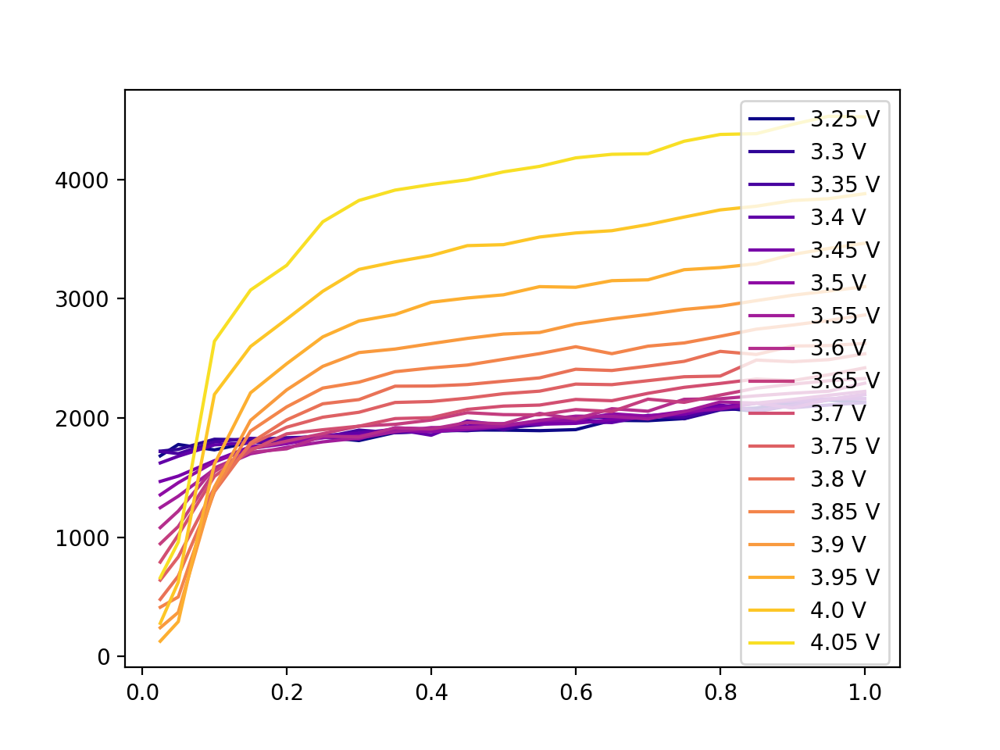

In [57]:
N = 17
cs = plt.get_cmap('plasma')([i/N for i in range(N)])
plt.figure()
for i in range(N):
    gv = 265 + i
    plt.plot(T, R3837[:, gv], color=cs[i], label='{} V'.format(Tgates[gv]))
    
plt.legend()

<IPython.core.display.Javascript object>


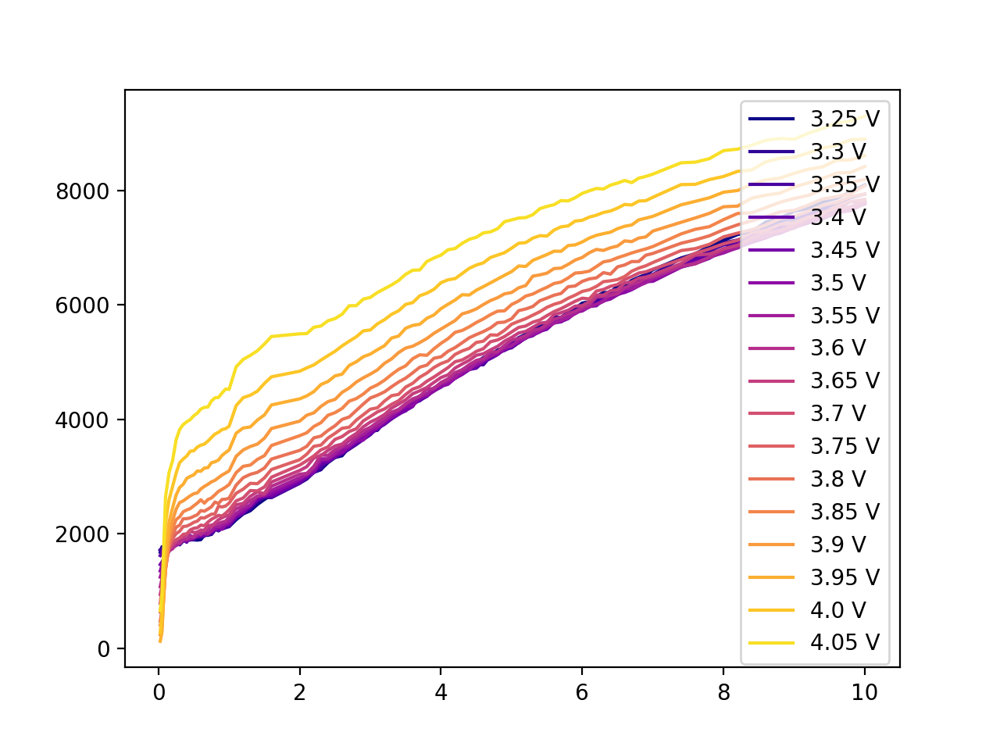

In [58]:
N = 17  # it looks like the 1-2K data bumps upward a little bit... Maybe it was a little better thermalized to the higher temp or something similar to that
cs = plt.get_cmap('plasma')([i/N for i in range(N)])
plt.figure()
for i in range(N):
    gv = 265 + i
    plt.plot(Tall, R3837_all[:, gv], color=cs[i], label='{} V'.format(Tgates[gv]))
    
plt.legend()

## Low-field dependence of the SC states

In [26]:
lfdata = qc.load_data('data/2019-10-06/#001_100mTto0TtwodSweep_0.5nAexcM08_Rxx38-37_Rxy38-44_basetemp_08-11-49')
Rxxlf = lfdata.lockin865_X[:, :]/0.5e-9
glf = lfdata.srframe_volt_p1_set[0, :]
blf = lfdata.triton_field_set_stable_set[:]

In [27]:
glf[80]

2.0

In [28]:
from matplotlib import colors
import scipy.ndimage

In [29]:
coff = colors.DivergingNorm(vcenter=1, vmin=0, vmax=10)

<IPython.core.display.Javascript object>


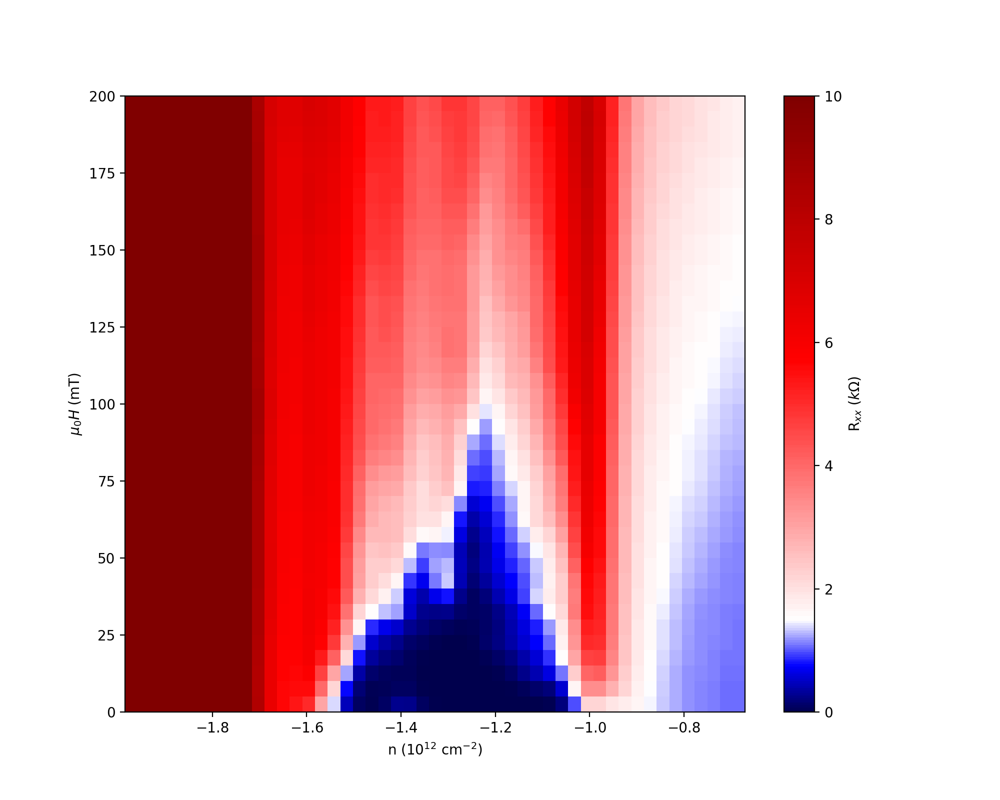

Text(0, 0.5, '$\\mu_0 H$ (mT)')

In [63]:
coff = colors.DivergingNorm(vcenter=1.5, vmin=0, vmax=10)
plt.figure(figsize=(10,8))
plt.pcolormesh(glf[125:175]*C/1.602e-19/10**16, blf*1000, scipy.ndimage.filters.gaussian_filter(Rxxlf[:, 125:175]/1000, 0.65), cmap='seismic', norm= coff, )
plt.colorbar(label='R$_{xx}$ $(k\Omega)$')
plt.xlabel('n (10$^{12}$ cm$^{-2}$)')
plt.ylabel('$\mu_0 H$ (mT)')
# plt.savefig(figfile + 'M08_lowfield_n_SCholepocket', dpi=300)

<IPython.core.display.Javascript object>


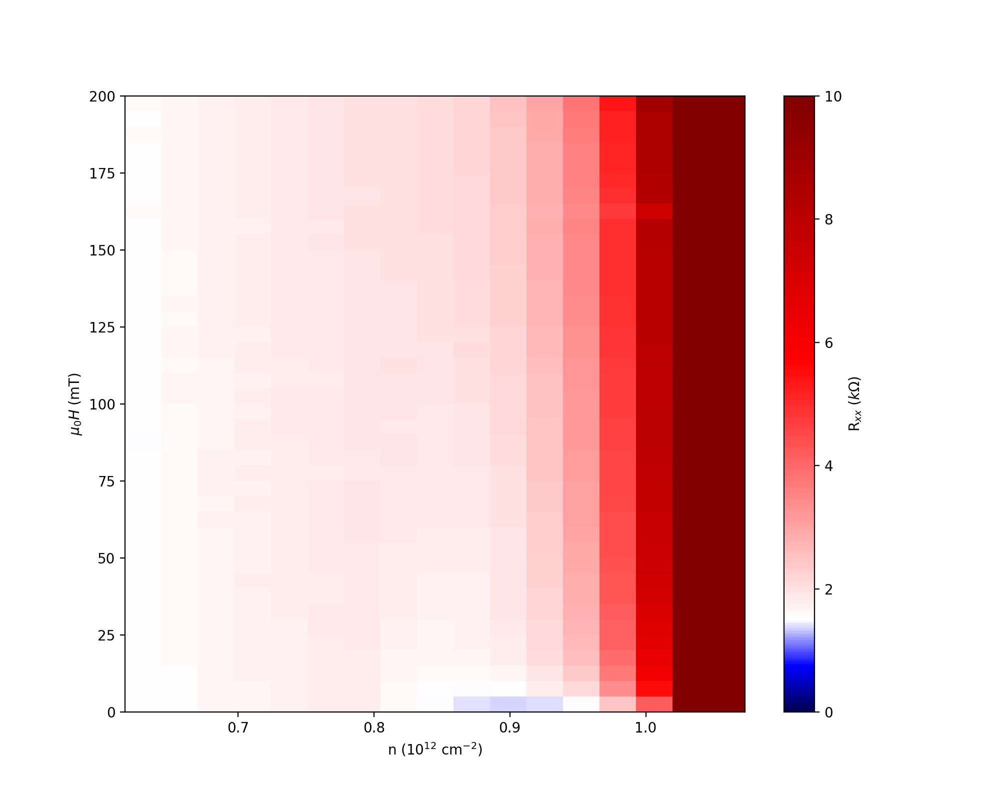

Text(0, 0.5, '$\\mu_0 H$ (mT)')

In [64]:
coff = colors.DivergingNorm(vcenter=1.5, vmin=0, vmax=10)
plt.figure(figsize=(10,8))
plt.pcolormesh(glf[60:78]*C/1.602e-19/10**16, blf*1000, Rxxlf[:, 60:78]/1000, cmap='seismic', norm= coff, )
plt.colorbar(label='R$_{xx}$ $(k\Omega)$')
plt.xlabel('n (10$^{12}$ cm$^{-2}$)')
plt.ylabel('$\mu_0 H$ (mT)')
# plt.savefig(figfile + 'M08_lowfield_n_SCelectronpocket', dpi=300)

In [65]:
V0

0.34537750837960846

In [30]:
# relook at low-temp data
R3837_all = np.vstack((R3837, R3837_m, R3837_H))
Tall = np.concatenate((T, midT, hT))
coff = colors.DivergingNorm(vcenter=1.4, vmin=0, vmax=100)

<IPython.core.display.Javascript object>


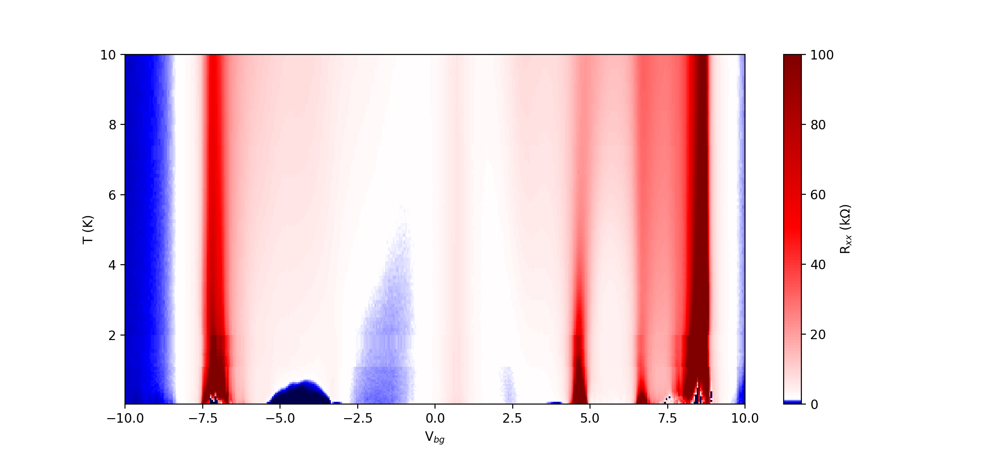

In [67]:
plt.figure(figsize=(11,5))
plt.pcolormesh(Tgates, Tall, R3837_all/1000, norm=coff, cmap='seismic')
plt.ylabel('T (K)')
plt.xlabel('V$_{bg}$')
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
# plt.savefig(figfile+'M08_Efetov-likeTgate', dpi=350)

In [51]:
from scipy.interpolate import RectBivariateSpline
from scipy.ndimage import gaussian_filter

In [52]:
R3837func = RectBivariateSpline(Tgates, Tall, R3837_all.T, kx=1, ky=1)

<IPython.core.display.Javascript object>


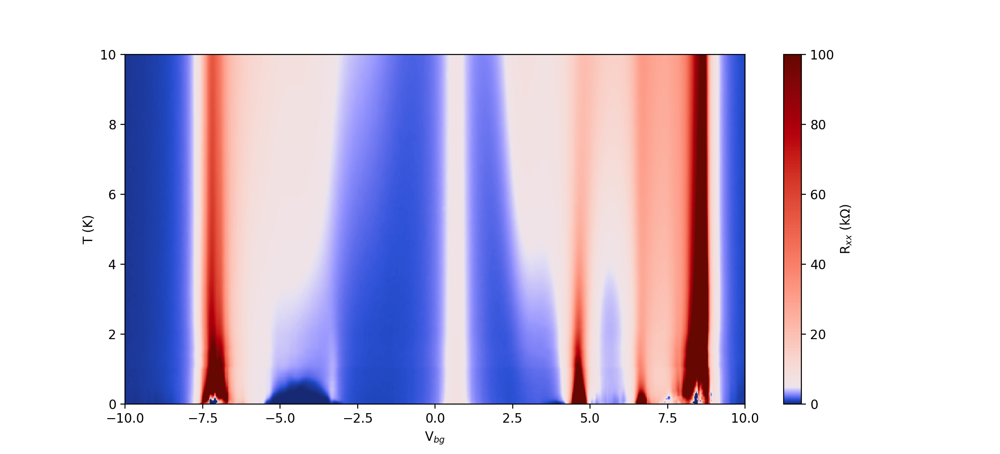

In [53]:
x = np.linspace(-10, 10, 1001)
y = np.linspace(0, 10, 801)
R3837int = gaussian_filter(R3837func(x, y).T, (0.8, 0.8))

plt.figure(figsize=(11,5))
coff = colors.DivergingNorm(vcenter=5, vmin=0, vmax=100)
plt.pcolormesh(x, y, R3837int/1000, norm=coff, cmap=cc.cm.diverging_bwr_20_95_c54)#cc.cm.diverging_bwg_20_95_c41)
plt.ylabel('T (K)')
plt.xlabel('V$_{bg}$')
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
# plt.savefig(figfile+'M08_Efetov-likeTgate', dpi=350)

In [76]:
npd.val_to_index([0, 2], Tgates)

[200, 240]

In [77]:
Tgates[240]

2.0

<IPython.core.display.Javascript object>


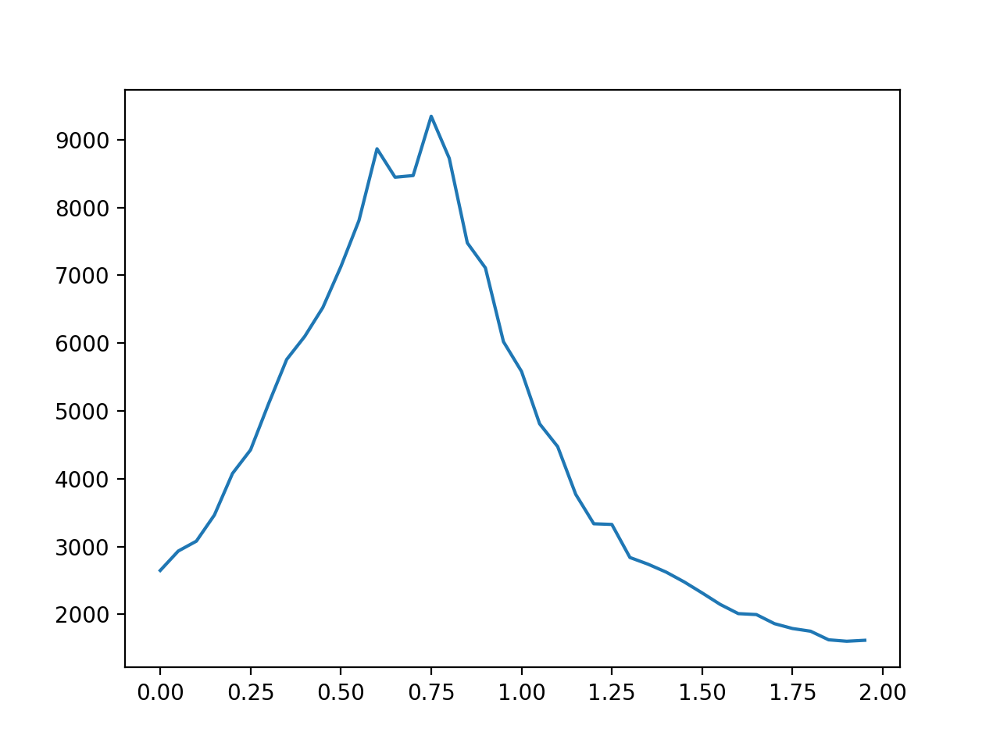

In [78]:
plt.figure()
plt.plot(Tgates[200:240], R3837_all[0, 200:240])

In [55]:
V0tempind = np.argmax(R3837_all[0, 200:240])
V0temp = Tgates[200 + V0tempind]

In [56]:
ntemp = C*(Tgates - V0temp)/1.602e-19/10**16 # in 10**12 cm^-2

In [57]:
nfull

2171931018694.1057

In [58]:
nutemp = ntemp/nfull*10**12

<IPython.core.display.Javascript object>


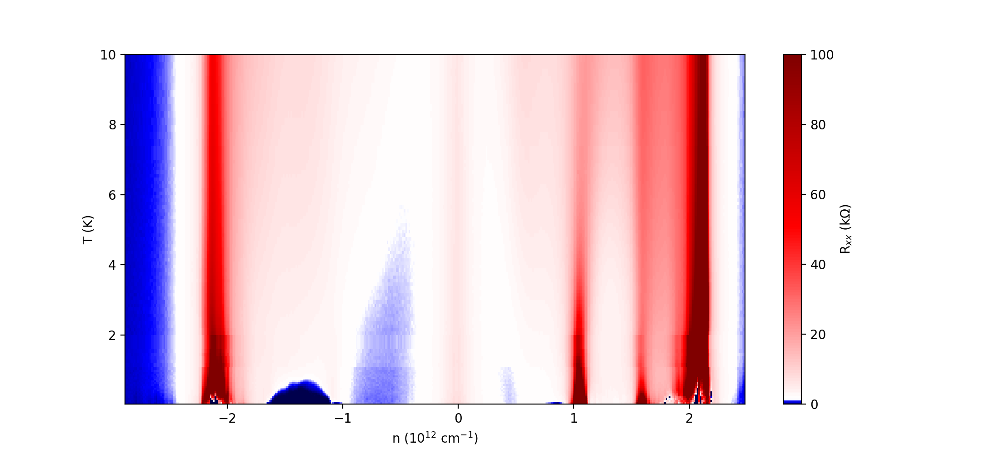

In [83]:
coff = colors.DivergingNorm(vcenter=1.4, vmin=0, vmax=100)

plt.figure(figsize=(11,5))
plt.pcolormesh(ntemp, Tall, R3837_all/1000, norm=coff, cmap='seismic')
plt.ylabel('T (K)')
plt.xlabel('n (10$^{12}$ cm$^{-1}$)')
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
# plt.savefig(figfile+'M08_Efetov-likeT_n', dpi=350)

<IPython.core.display.Javascript object>


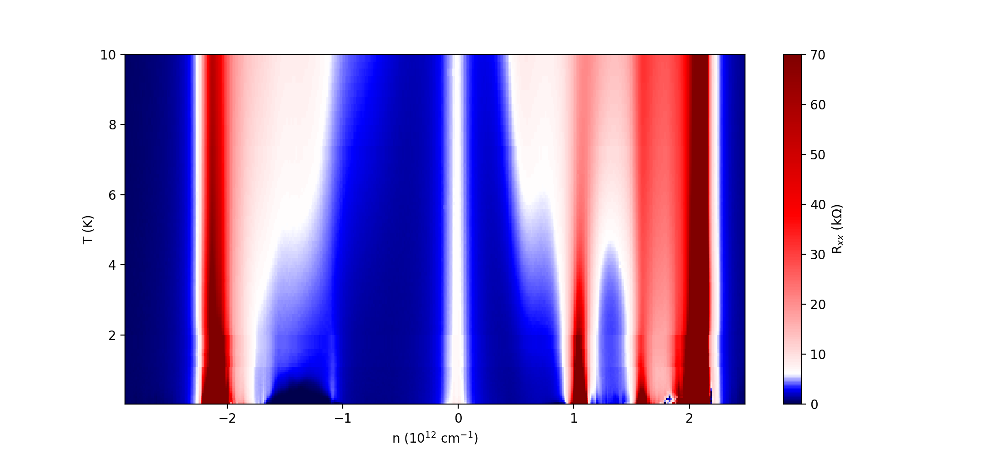

In [84]:
coff = colors.DivergingNorm(vcenter=6, vmin=0, vmax=70)

plt.figure(figsize=(11,5))
plt.pcolormesh(ntemp, Tall, R3837_all_2/1000, norm=coff, cmap='seismic')
plt.ylabel('T (K)')
plt.xlabel('n (10$^{12}$ cm$^{-1}$)')
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
# plt.savefig(figfile+'M08_Efetov-likeT_n_6center', dpi=350)

In [60]:
ntemp[-1]

2.4812814280913758

<IPython.core.display.Javascript object>


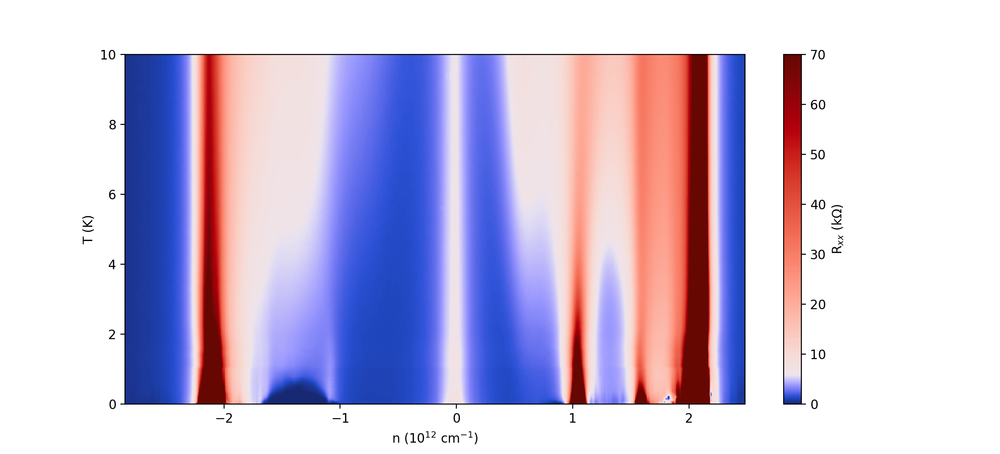

In [62]:
R3837func2 = RectBivariateSpline(ntemp, Tall, R3837_all_2.T, kx=1, ky=1)
x = np.linspace(-2.85, 2.48, 1001)
y = np.linspace(0, 10, 801)
R3837int2 = gaussian_filter(R3837func2(x, y).T, (0.8, 0.8))
coff = colors.DivergingNorm(vcenter=6, vmin=0, vmax=70)

plt.figure(figsize=(11,5))
plt.pcolormesh(x, y, R3837int2/1000, norm=coff, cmap=cc.cm.diverging_bwr_20_95_c54)
plt.ylabel('T (K)')
plt.xlabel('n (10$^{12}$ cm$^{-1}$)')
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
# plt.savefig(figfile+'M08_Efetov-likeT_n_6center', dpi=350)

In [123]:
npd.val_to_index([1.05/2], ntemp)

0.53 is not a value in the array
Plotted 0.52 instead


[254]

In [178]:
def arrheniushopfit(invT, delta, T0, A, B):
    """Returns the conductance"""
    return A*np.exp(-invT*delta/1.381e-23*1.602e-19/2) + B*np.exp(-(T0*invT)**(1/3))

<IPython.core.display.Javascript object>


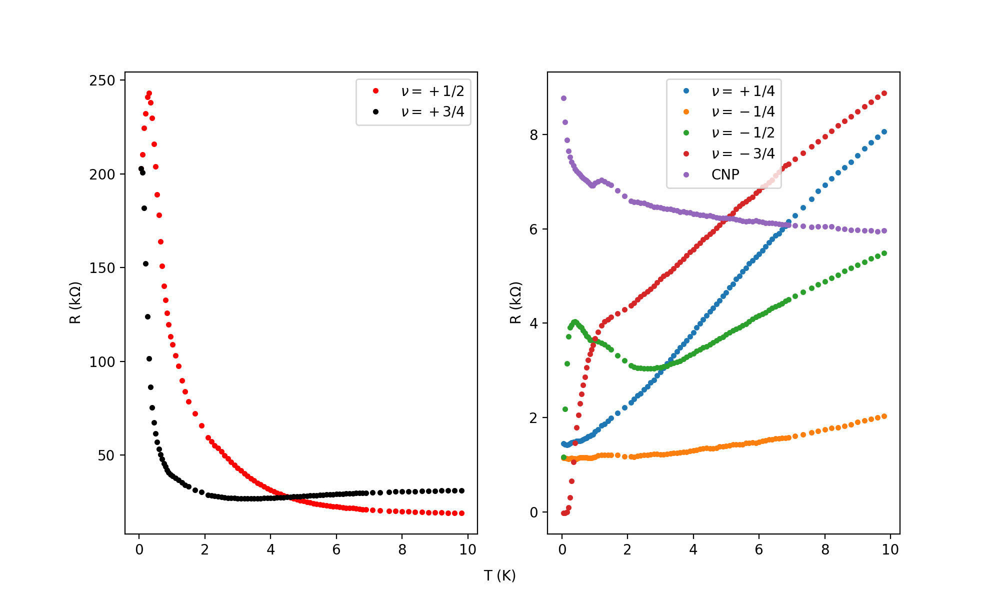

In [50]:
fig, ax = plt.subplots(1,2, figsize=(10, 6))
nav = 3
Tallav = npd.mov_average(Tall, nav)
l1 = ax[0].plot(Tallav, npd.mov_average(R3837_all[:, 293], nav)/1000, 'r.', label=r'$\nu = +1/2$')
l2 = ax[0].plot(Tallav, npd.mov_average(R3837_all[:, 333], nav)/1000, 'k.',  label=r'$\nu = +3/4$')
ax[1].plot(Tallav, npd.mov_average(R3837_all[:, 254], nav)/1000, '.', label=r'$\nu = +1/4$')
ax[1].plot(Tallav, npd.mov_average(R3837_all[:, 176], nav)/1000, '.', label=r'$\nu = -1/4$')
ax[1].plot(Tallav, npd.mov_average(R3837_all[:, 134], nav)/1000, '.', label=r'$\nu = -1/2$')
ax[1].plot(Tallav, npd.mov_average(R3837_all[:, 98], nav)/1000, '.', label=r'$\nu = -3/4$')
ax[1].plot(Tallav, npd.mov_average(R3837_all[:, 215], nav)/1000, '.', label='CNP')
ax[0].legend()
ax[0].set_ylabel('R (k$\Omega$)')
ax[1].set_ylabel('R (k$\Omega$)')
fig.text(0.5, 0.04, 'T (K)', va='center', ha='center', fontsize=plt.rcParams['axes.labelsize'])
ax[1].legend()
# plt.savefig(figfile + 'M08_integerfilling_R-tempPlots', dpi=300)

<IPython.core.display.Javascript object>


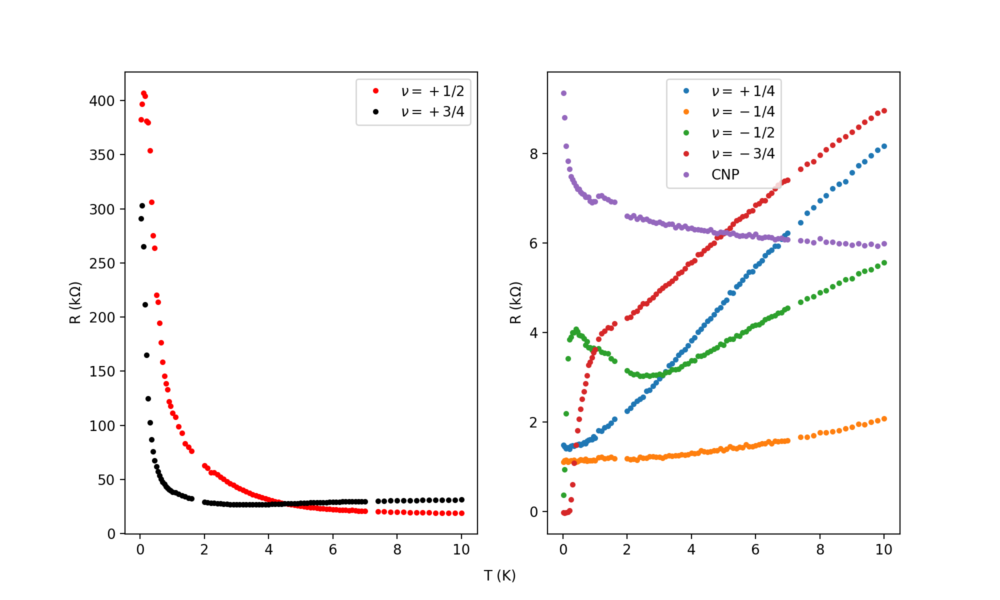

In [72]:
fig, ax = plt.subplots(1,2, figsize=(10, 6))
nav = 1
Tallav = npd.mov_average(Tall, nav)
l1 = ax[0].plot(Tallav, npd.mov_average(R3837_all_2[:, 293], nav)/1000, 'r.', label=r'$\nu = +1/2$')
l2 = ax[0].plot(Tallav, npd.mov_average(R3837_all_2[:, 333], nav)/1000, 'k.',  label=r'$\nu = +3/4$')
ax[1].plot(Tallav, npd.mov_average(R3837_all_2[:, 254], nav)/1000, '.', label=r'$\nu = +1/4$')
ax[1].plot(Tallav, npd.mov_average(R3837_all_2[:, 176], nav)/1000, '.', label=r'$\nu = -1/4$')
ax[1].plot(Tallav, npd.mov_average(R3837_all_2[:, 134], nav)/1000, '.', label=r'$\nu = -1/2$')
ax[1].plot(Tallav, npd.mov_average(R3837_all_2[:, 98], nav)/1000, '.', label=r'$\nu = -3/4$')
ax[1].plot(Tallav, npd.mov_average(R3837_all_2[:, 215], nav)/1000, '.', label='CNP')
ax[0].legend()
ax[0].set_ylabel('R (k$\Omega$)')
ax[1].set_ylabel('R (k$\Omega$)')
fig.text(0.5, 0.04, 'T (K)', va='center', ha='center', fontsize=plt.rcParams['axes.labelsize'])
ax[1].legend()
# plt.savefig(figfile + 'M08_integerfilling_R-tempPlots', dpi=300)

In [213]:

print(theta)

[8.02370461e-04 3.71210660e+00 6.13360576e-05 3.44533076e-05]


In [198]:
len(Tall)

92

In [258]:
print(Tall[6:])

[ 0.3   0.35  0.4   0.45  0.5   0.55  0.6   0.65  0.7   0.75  0.8   0.85
  0.9   0.95  1.    1.1   1.2   1.3   1.4   1.5   1.6   2.    2.1   2.2
  2.3   2.4   2.5   2.6   2.7   2.8   2.9   3.    3.1   3.2   3.3   3.4
  3.5   3.6   3.7   3.8   3.9   4.    4.1   4.2   4.3   4.4   4.5   4.6
  4.7   4.8   4.9   5.    5.1   5.2   5.3   5.4   5.5   5.6   5.7   5.8
  5.9   6.    6.1   6.2   6.3   6.4   6.5   6.6   6.7   6.8   6.9   7.
  7.4   7.6   7.8   8.    8.2   8.4   8.6   8.8   9.    9.2   9.4   9.6
  9.8  10.  ]


In [235]:
from functools import partial

In [ ]:
arrheniushopfit()

In [239]:
def ahop2(invT, T0, A, B):
    return arrheniushopfit(invT, 0.681e-3, T0, A, B)

In [263]:
theta, pcov = curve_fit(ahop2, 1/Tall[6:], 1/R3837_all_2[6:, 293], p0=[1, 1.0e-4, 1.0e-4], bounds=(0, np.inf))
print('gap: {:.4f} meV, T0: {:.3f}'.format(0.681e-3*1000, theta[0]))

gap: 0.6810 meV, T0: 7.910


<IPython.core.display.Javascript object>


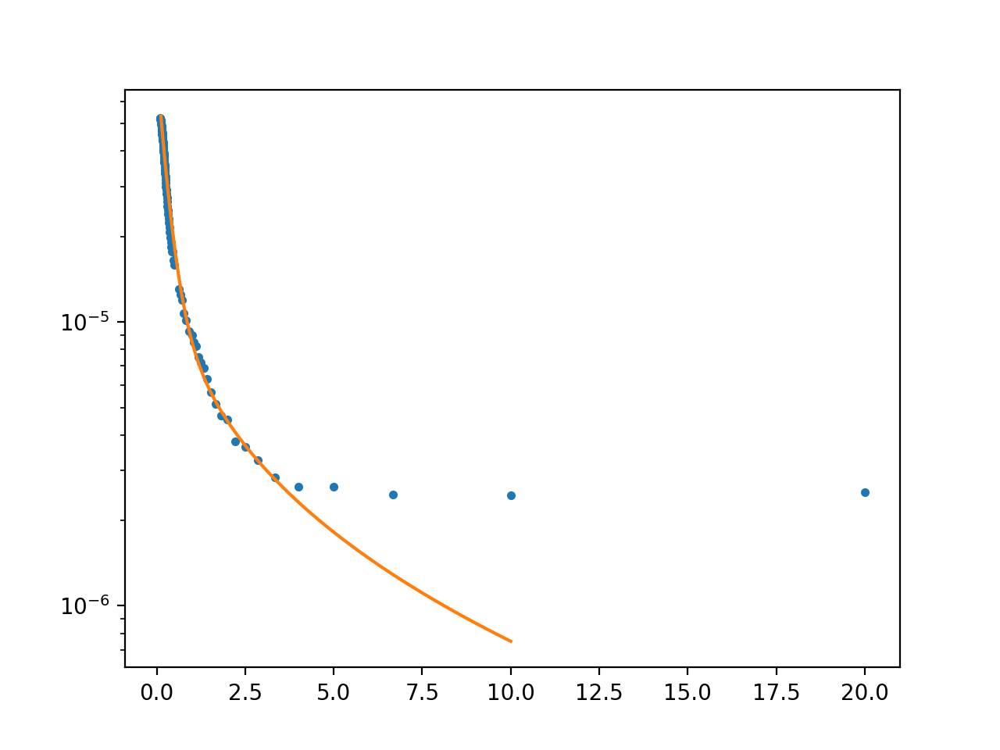

In [264]:
plt.figure()
plt.semilogy(1/Tall[1:], 1/R3837_all_2[1:, 293], '.')
x = np.linspace(0.12, 10, 100)
plt.semilogy(x, arrheniushopfit(x, 0.681e-3, *theta))
# plt.axis(a)

In [219]:
a = plt.axis()

In [103]:
npd.val_to_index([0.35, 0.16], 1/Tall)

0.35 is not a value in the array
Plotted 0.34 instead
0.16 is not a value in the array
Plotted 0.16 instead


[36, 70]

In [111]:
npd.val_to_index([3.95, 0.5], 1/Tall)

3.95 is not a value in the array
Plotted 4.00 instead


[5, 27]

In [127]:
m1, b1 = np.polyfit(1/Tall[35:71], np.log(1/R3837_all_2[35:71, 293]), 1)
m2, b2 = np.polyfit(1/Tall[7:30], np.log(1/R3837_all_2[7:30, 333]), 1)

<IPython.core.display.Javascript object>


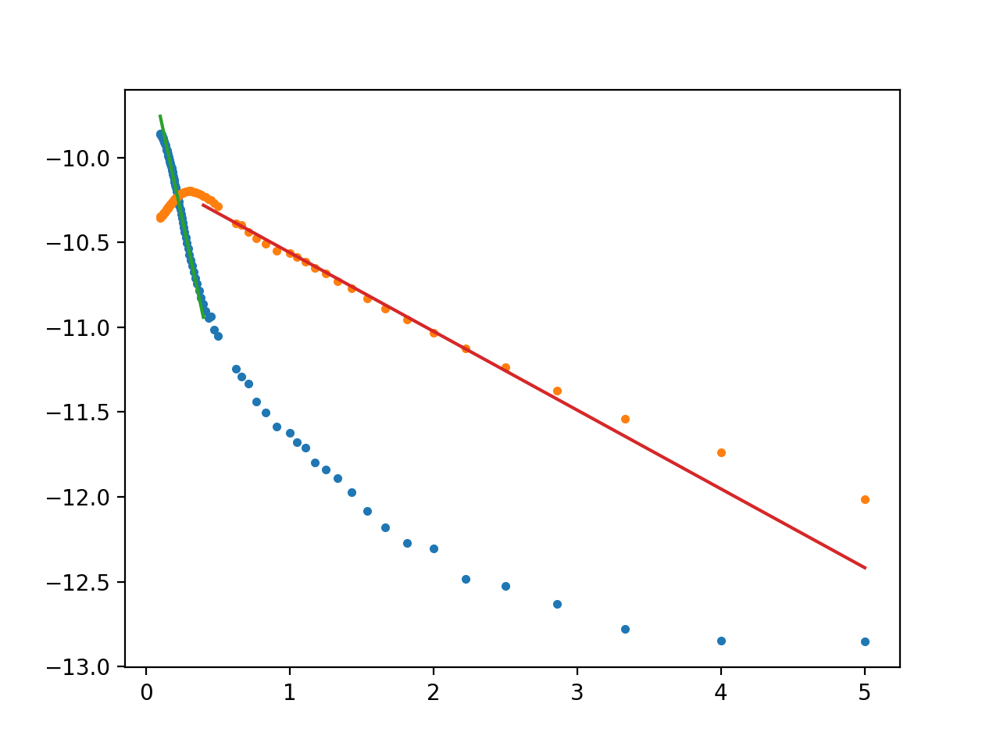

In [128]:
plt.figure()
plt.plot(1/Tall[4:], np.log(1/R3837_all_2[4:, 293]), '.')
plt.plot(1/Tall[4:], np.log(1/R3837_all_2[4:, 333]), '.')
x1 = np.array([0.1, 0.4])
plt.plot(x1, x1*m1 + b1)
x2 = np.array([0.4, 5])
plt.plot(x2, x2*m2 + b2)

<IPython.core.display.Javascript object>


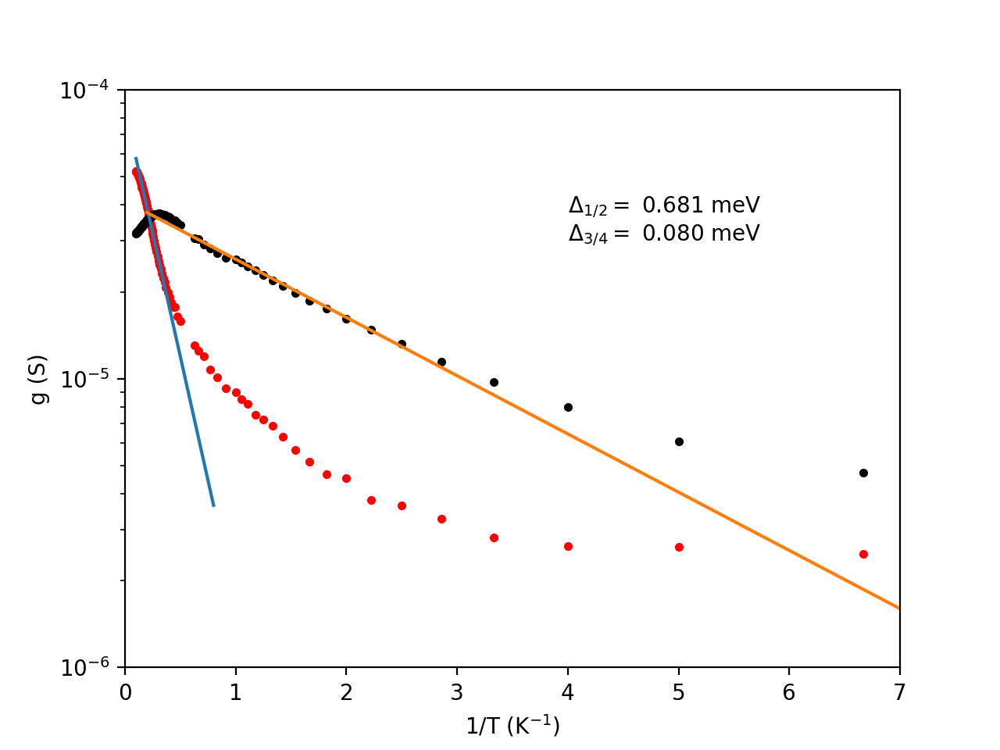

In [183]:
plt.figure()
plt.semilogy(1/Tall, 1/R3837_all_2[:, 293], 'r.', label=r'$\nu = +1/2$')
plt.semilogy(1/Tall, 1/R3837_all_2[:, 333], 'k.',  label=r'$\nu = +3/4$')
x1 = np.array(np.linspace(0.1, 0.8, 20))
plt.semilogy(x1, np.exp(m1*x1 + b1))
x2 = np.array(np.linspace(0.2, 7, 20))
plt.semilogy(x2, np.exp(m2*x2 + b2))
plt.xlabel('1/T (K$^{-1}$)')
plt.ylabel('g (S)')
plt.axis([0, 7, 10**-6, 10**-4])
s1 = '$\Delta_{1/2} = $' + ' {:.3f} meV'.format(-m1*1.381e-23/1.602e-19*1000*2)
s2 = '$\Delta_{3/4} = $' + ' {:.3f} meV'.format(-m2*1.381e-23/1.602e-19*1000*2)
plt.text(4, 3*10**-5, s1+'\n'+s2)

plt.savefig(figfile + 'M08_half_threequart_gapsize_Arrh', dpi=300)

In [136]:
print(-m1*1.381e-23/1.602e-19*1000*2, -m1*2) # in meV, K for nu = +1/2

0.6810218869445769 7.900051143267286


In [137]:
print(-m2*1.381e-23/1.602e-19*1000*2, -m2*2) # in meV, K for nu = +3/4

0.08007314798264781 0.9288717094004474


<IPython.core.display.Javascript object>


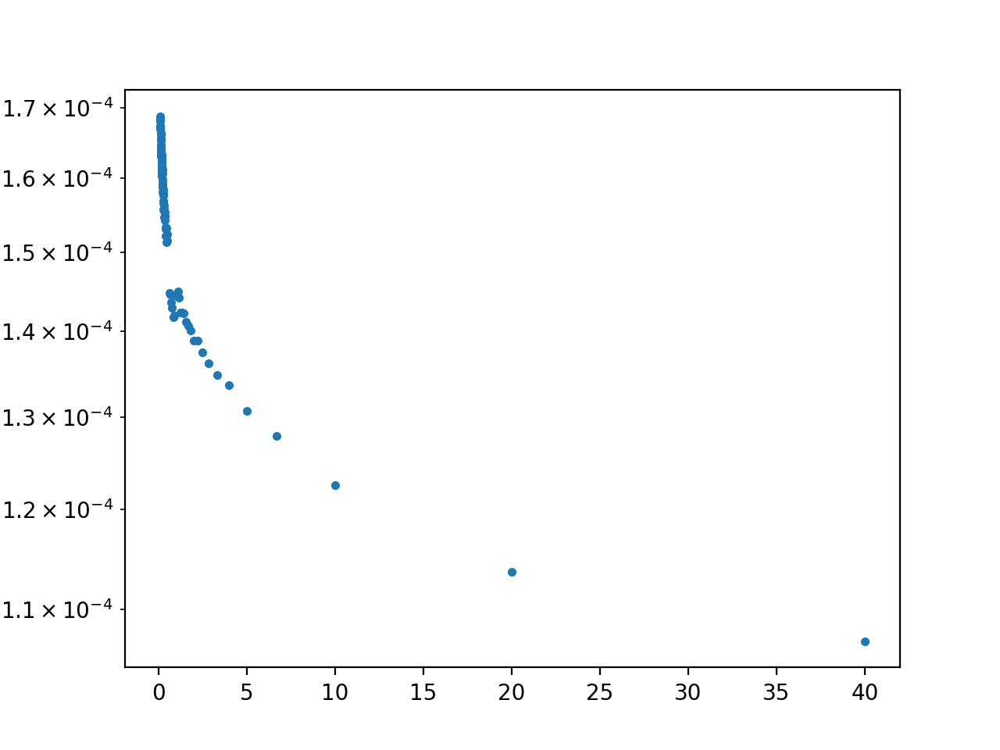

In [166]:
plt.figure()  #CNP... doesn't seem to fit anything well... Not Arrhenius. Not VRH e^(-(T0/T)^3)
plt.semilogy(1/Tall, 1/R3837_all_2[:, 215], '.')


In [89]:
ntemp[293]

1.046161899411499

In [88]:
npd.val_to_index([1.05], ntemp)

1.05 is not a value in the array
Plotted 1.05 instead


[293]

In [229]:
len(Tall)

92

In [70]:
25*4

100

In [267]:
Tall[86]

9.0

In [86]:
npd.val_to_index([-2.0], ntemp)

-2.00 is not a value in the array
Plotted -2.00 instead


[66]

In [120]:
n1 = -71
n2 = -1

slfulln, bfulln = np.polyfit(1/Tall[n1:n2], np.log(1/R3837_all_2[n1:n2, 61]), 1)

<IPython.core.display.Javascript object>


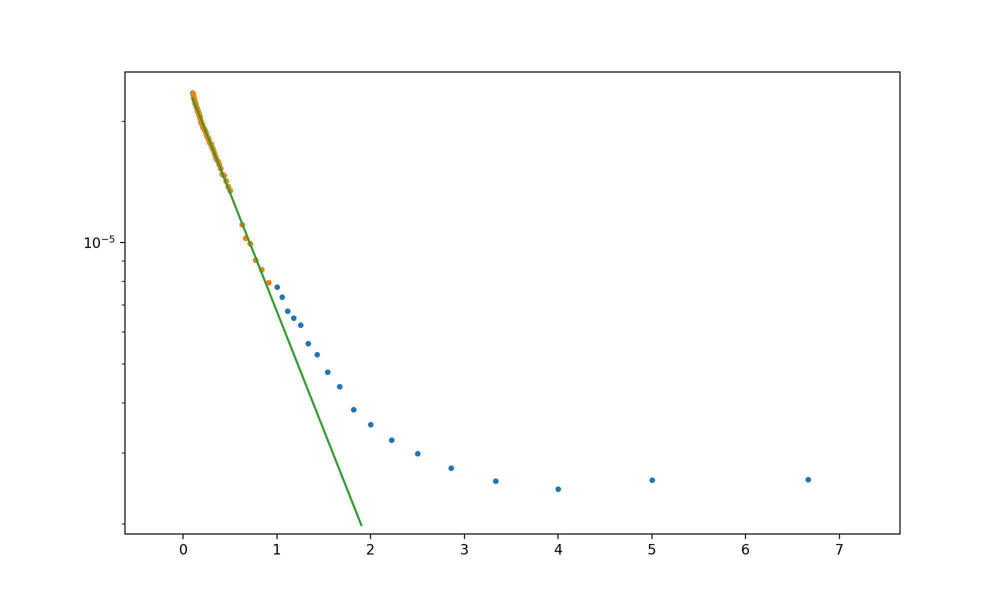

(-0.6207741935483888,
 7.647535483870966,
 1.8902989634684383e-06,
 2.6509868823586202e-05)

In [126]:
plt.figure(figsize=(10, 6))
n1 = -71
n2 = -1
plt.semilogy(1/Tall, 1/R3837_all_2[:, 61], '.')
plt.semilogy(1/Tall[n1:n2], 1/R3837_all_2[n1:n2, 61], '.')
x = np.linspace(0.1, 1.9, 100)
plt.semilogy(x, np.exp(slfulln*x + bfulln))
plt.axis(a)

In [127]:
print('Negative full filling gap: {:.3f} meV'.format(-2*slfulln*1.381e-23/1.602e-19*1000))

Negative full filling gap: 0.234 meV


In [125]:
a = plt.axis()

In [ ]:
gap = 0.234e-3
intercept = bfulln

In [393]:
def ahop3(invT, T0, A):
    B = np.exp(bfulln) - A
    return arrheniushopfit(invT, 0.234e-3, T0, A, B)

In [397]:
theta, pcov = curve_fit(ahop3, 1/Tall[6:], 1/R3837_all_2[6:, 61], p0=[0.4, 2e-5], bounds=(0, np.inf))
print('gap: {:.4f} meV, T0: {:.3f}'.format(0.234, theta[0]))

gap: 0.2340 meV, T0: 0.259


In [398]:
theta

array([2.59163451e-01, 2.32142504e-05])

<IPython.core.display.Javascript object>


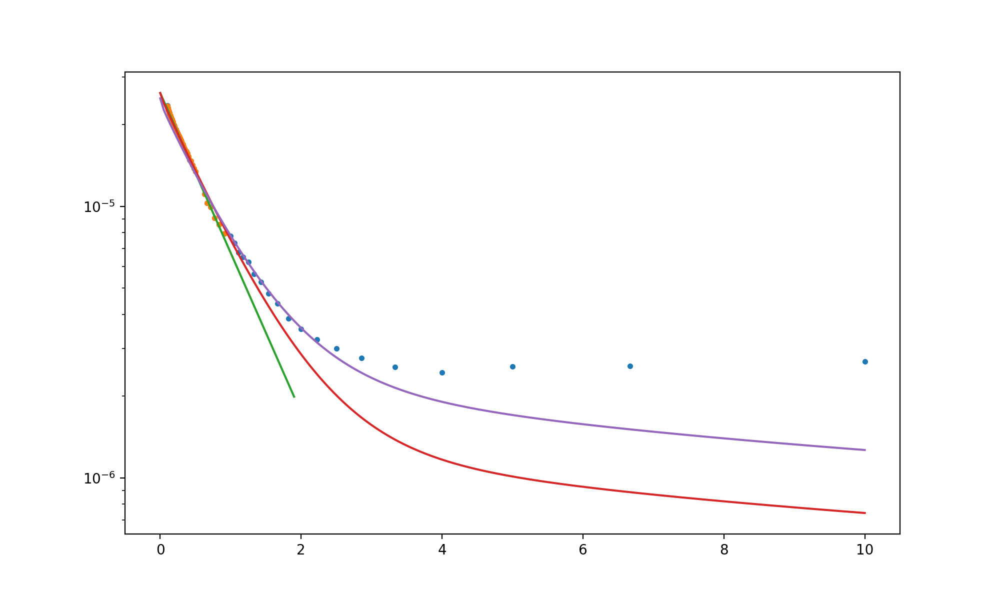

In [404]:
plt.figure(figsize=(10, 6))
n1 = -71
n2 = -1
plt.semilogy(1/Tall[2:], 1/R3837_all_2[2:, 61], '.')
plt.semilogy(1/Tall[n1:n2], 1/R3837_all_2[n1:n2, 61], '.')
x = np.linspace(0, 1.9, 100)
plt.semilogy(x, np.exp(slfulln*x + bfulln))
x2 = np.linspace(0, 10, 200)
plt.semilogy(x2, ahop3(x2, *theta))
plt.semilogy(x2, arrheniushopfit(x2, 0.234e-3, 0.259, 2e-5, 0.5e-5))
# plt.axis(a)

In [448]:
ntemp[373]

2.119148462910472

In [406]:
npd.val_to_index([2.05], ntemp)

2.05 is not a value in the array
Plotted 2.05 instead


[368]

In [472]:
n1 = -65
n2 = None

slfullp, bfullp = np.polyfit(1/Tall[n1:n2], np.log(1/R3837_all_2[n1:n2, 373]), 1)

<IPython.core.display.Javascript object>


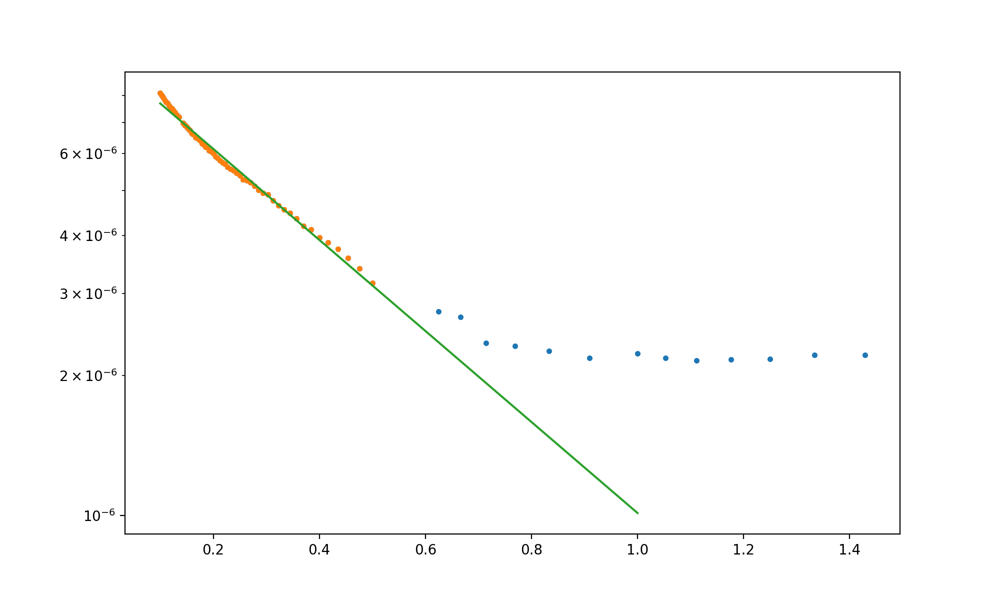

In [474]:
plt.figure(figsize=(10, 6))
n1 = -65
n2 = None
plt.semilogy(1/Tall[14:], 1/R3837_all_2[14:, 373], '.')
plt.semilogy(1/Tall[n1:n2], 1/R3837_all_2[n1:n2, 373], '.')
x = np.linspace(0.1, 1.0, 100)
plt.semilogy(x, np.exp(slfullp*x + bfullp))
# plt.axis(a)

In [475]:
print('Positive full filling gap: {:.3f} meV'.format(-2*slfullp*1.381e-23/1.602e-19*1000))

Positive full filling gap: 0.388 meV


## For full filling on the 0.97$^\circ$ device, the gap values (from our limited temp dependence, which is probably wrong) are 0.39 meV on the positive (electron) side and 0.23 meV on the negative (hole) side

The 2-component fit with VRH didn't seem to fit well.

In [477]:
1/0.004

250.0

In [260]:
np.arange(27, 87, 10)

array([27, 37, 47, 57, 67, 77])

In [269]:
len(cycle)

15

<IPython.core.display.Javascript object>


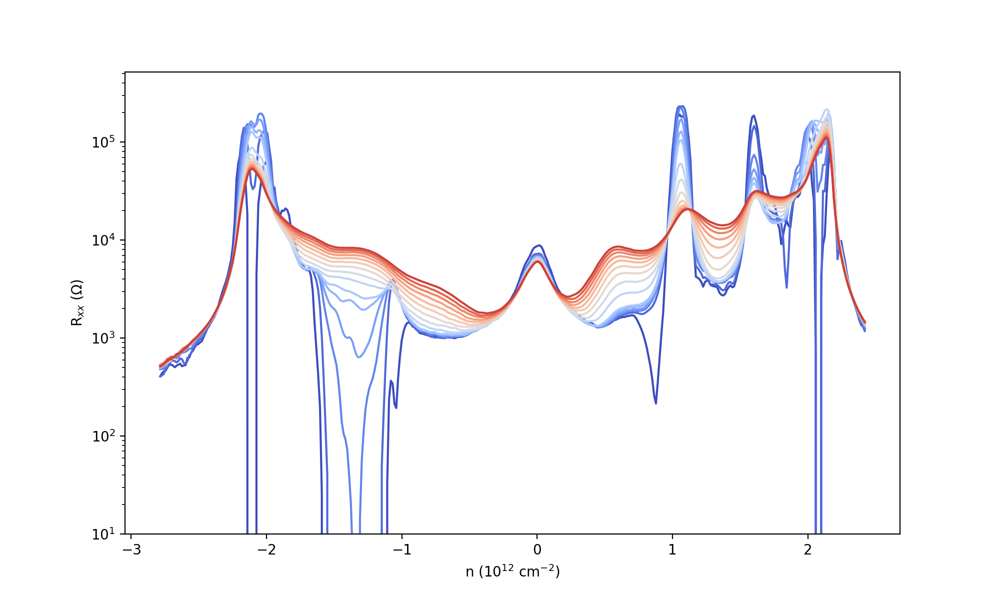

0.025
0.2
0.4
0.6
0.8
1.0
2.0
3.0
4.0
5.0
6.0
7.0
8.0
9.0
10.0


(10, 520000.0)

In [41]:
V0 = 0.68
cycle = np.concatenate((np.arange(0, 6)*4, np.arange(27, 87, 10), [81, 86, 91]))
N = len(cycle)
cs = plt.get_cmap('coolwarm')([i/N for i in range(N)])

plt.figure(figsize=(10,6))
nav = 3
for i, ind in enumerate(cycle):
    print(Tall[ind])
    plt.semilogy((npd.mov_average(Tgates[5:-5], nav) - V0)*C/1.602e-19/10**16, npd.mov_average(R3837_all[ind, 5:-5], nav), color=cs[i])

plt.ylabel('R$_{xx}$ ($\Omega$)')
plt.xlabel('n (10$^{12}$ cm$^{-2}$)')
plt.ylim(10, 5.2e5)
# plt.savefig(figfile + 'M08_multitemp_gatesweeps', dpi=350)

<IPython.core.display.Javascript object>


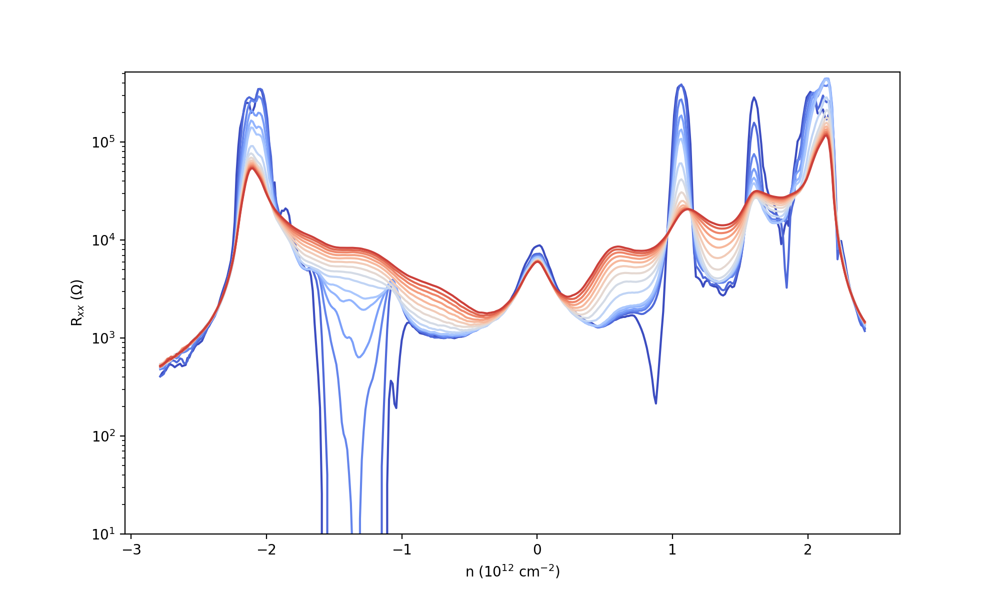

In [43]:
cycle = np.concatenate((np.arange(0, 6)*4, np.arange(27, 87, 10), [81, 86, 91]))
N = len(cycle)
cs = plt.get_cmap('coolwarm')([i/N for i in range(N)])

plt.figure(figsize=(10,6))
nav = 3
for i, ind in enumerate(cycle):
#     print(Tall[ind])
    plt.semilogy((npd.mov_average(Tgates[5:-5], nav)-V0)*C/1.602e-19/10**16, npd.mov_average(R3837_all_2[ind, 5:-5], nav), color=cs[i])

plt.ylabel('R$_{xx}$ ($\Omega$)')
plt.xlabel('n (10$^{12}$ cm$^{-2}$)')
plt.ylim(10, 5.2e5)
plt.savefig(figfile + 'M08_multitemp_gatesweeps', dpi=350)

Try something with both a diverging--with offset center--and a logarithmic norm at the same time.

In [478]:
a = 5

In [479]:
a /= 2

In [480]:
a

2.5

In [496]:
a = np.array([1, 2, 4, 5, 5, 10, 1000, 0.2, 0.1, 5])

In [499]:
np.log(a, a)

array([ 0.        ,  0.69314718,  1.38629436,  1.60943791,  1.60943791,
        2.30258509,  6.90775528, -1.60943791, -2.30258509,  1.60943791])

In [501]:
a -= np.log(0.1)

In [502]:
a

array([2.30258509, 2.99573227, 3.68887945, 3.91202301, 3.91202301,
       4.60517019, 9.21034037, 0.69314718, 0.        , 3.91202301])

In [503]:
a /= (np.log(1000) - np.log(0.1))

In [504]:
a

array([0.25     , 0.3252575, 0.400515 , 0.4247425, 0.4247425, 0.5      ,
       1.       , 0.0752575, 0.       , 0.4247425])

In [497]:
res = np.ma.masked_less_equal(a, 0, copy=False)

In [498]:
res

masked_array(data=[1.e+00, 2.e+00, 4.e+00, 5.e+00, 5.e+00, 1.e+01, 1.e+03,
                   2.e-01, 1.e-01, 5.e+00],
             mask=False,
       fill_value=1e+20)

In [ ]:
np.log()

In [525]:
from matplotlib.colors import Normalize
class DivLogNorm(Normalize):
    """Normalize a given value to the 0-1 range on a log scale."""
    def __init__(self, centerpct, vmin=None, vmax=None, clip=False):
        super().__init__(vmin, vmax, clip)
        self.centerpct = centerpct

    def __call__(self, value, clip=None):
        if clip is None:
            clip = self.clip

        result, is_scalar = self.process_value(value)

        result = np.ma.masked_less_equal(result, 0, copy=False)

        self.autoscale_None(result)
        vmin, vmax = self.vmin, self.vmax
        if vmin > vmax:
            raise ValueError("minvalue must be less than or equal to maxvalue")
        elif vmin <= 0:
            raise ValueError("values must all be positive")
        elif vmin == vmax:
            result.fill(0)
        else:
            if clip:
                mask = np.ma.getmask(result)
                result = np.ma.array(np.clip(result.filled(vmax), vmin, vmax),
                                     mask=mask)
            # in-place equivalent of above can be much faster
            resdat = result.data
            mask = result.mask
            if mask is np.ma.nomask:
                mask = (resdat <= 0)
            else:
                mask |= resdat <= 0
            np.copyto(resdat, 1, where=mask)
            np.log(resdat, resdat)
            resdat -= np.log(vmin)
            resdat /= (np.log(vmax) - np.log(vmin))
            result = np.ma.array(resdat, mask=mask, copy=False)
            result = np.ma.masked_array(
                np.interp(result, [0, self.centerpct, 1],
                          [0, 0.5, 1.]), mask=np.ma.getmask(result))
        if is_scalar:
            result = result[0]
        return result

    def inverse(self, value):
        if not self.scaled():
            raise ValueError("Not invertible until scaled")
        vmin, vmax = self.vmin, self.vmax

        if np.iterable(value):
            val = np.ma.asarray(value)
            return vmin * np.ma.power((vmax / vmin), val)
        else:
            return vmin * pow((vmax / vmin), value)

    def autoscale(self, A):
        # docstring inherited.
        super().autoscale(np.ma.masked_less_equal(A, 0, copy=False))

    def autoscale_None(self, A):
        # docstring inherited.
        super().autoscale_None(np.ma.masked_less_equal(A, 0, copy=False))

<IPython.core.display.Javascript object>


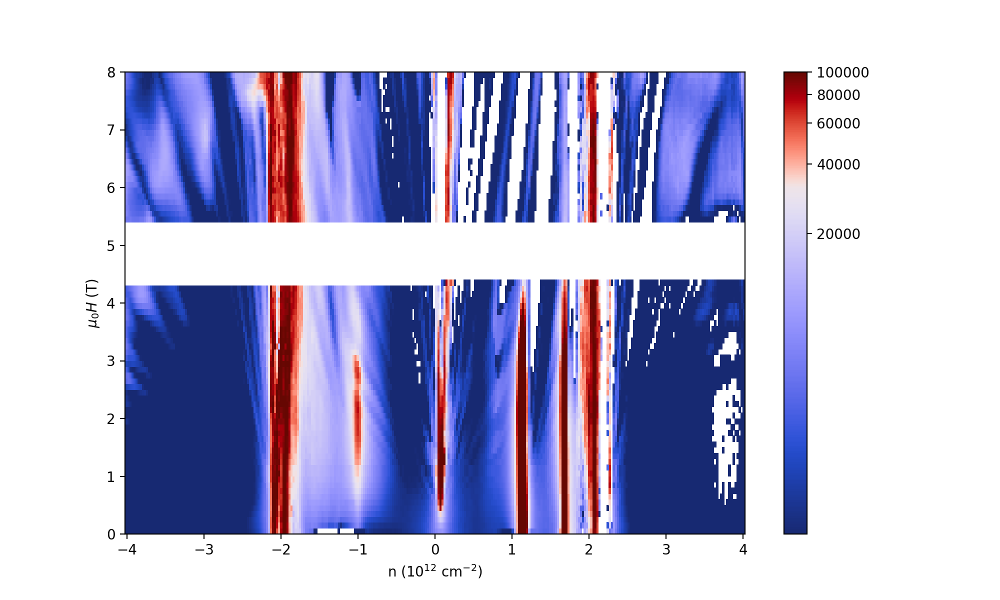

Text(0, 0.5, '$\\mu_0 H$ (T)')

In [532]:
cdivlog = DivLogNorm(0.75, 1000, 1e5)
plt.figure(figsize=(10,6))
plt.pcolormesh(gates*C/1.602e-19/10**16, fields, pfan, cmap=cc.cm.diverging_bwr_20_95_c54, norm=cdivlog)#SymLogNorm(500, vmin=0, vmax=5*10**4))
plt.colorbar()
plt.xlabel('n (10$^{12}$ cm$^{-2}$)')
plt.ylabel('$\mu_0 H$ (T)')

# M05 PPMS contacts 13-14 (Triton 20-16)

In [7]:
pwd

'/Users/robertpolski/Documents/NPGroupResearch/Measurements/Triton/qcodes_data'

In [8]:
m05dfanel = qc.load_data('../../PPMS/qcodes_data/data/2019-09-23/#030_1p7K_contacts13-14_twod_positivegate_18-22-06')
m05dfanel

DataSet:
   location = '../../PPMS/qcodes_data/data/2019-09-23/#030_1p7K_contacts13-14_twod_positivegate_18-22-06'
   <Type>   | <array_id>                | <array.name>     | <array.shape>
   Setpoint | ppms_field_set_stable_set | field_set_stable | (91,)
   Setpoint | k2200_voltage_set         | voltage          | (91, 201)
   Measured | lockin1_X                 | X                | (91, 201)
   Measured | lockin1_Y                 | Y                | (91, 201)

In [9]:
m05dfanhole = qc.load_data('../../PPMS/qcodes_data/data/2019-09-24/#002_1p7K_contacts13-14_twod_negativegate_08-45-55')
m05dfanhole

DataSet:
   location = '../../PPMS/qcodes_data/data/2019-09-24/#002_1p7K_contacts13-14_twod_negativegate_08-45-55'
   <Type>   | <array_id>                | <array.name>     | <array.shape>
   Setpoint | ppms_field_set_stable_set | field_set_stable | (91,)
   Setpoint | k2200_voltage_set         | voltage          | (91, 201)
   Measured | lockin1_X                 | X                | (91, 201)
   Measured | lockin1_Y                 | Y                | (91, 201)

In [10]:
gm05 = np.concatenate((-1*m05dfanhole.k2200_voltage_set[0, :], np.flip(m05dfanel.k2200_voltage_set[0, :-1])))
bm05 = m05dfanhole.ppms_field_set_stable_set[:]/1000
Rm05 = np.hstack((m05dfanhole.lockin1_X[:, :]/1e-9, np.flip(np.flip(m05dfanel.lockin1_X[:, :-1], axis=1), axis=0)/1e-9))

In [18]:
%matplotlib notebook

<IPython.core.display.Javascript object>


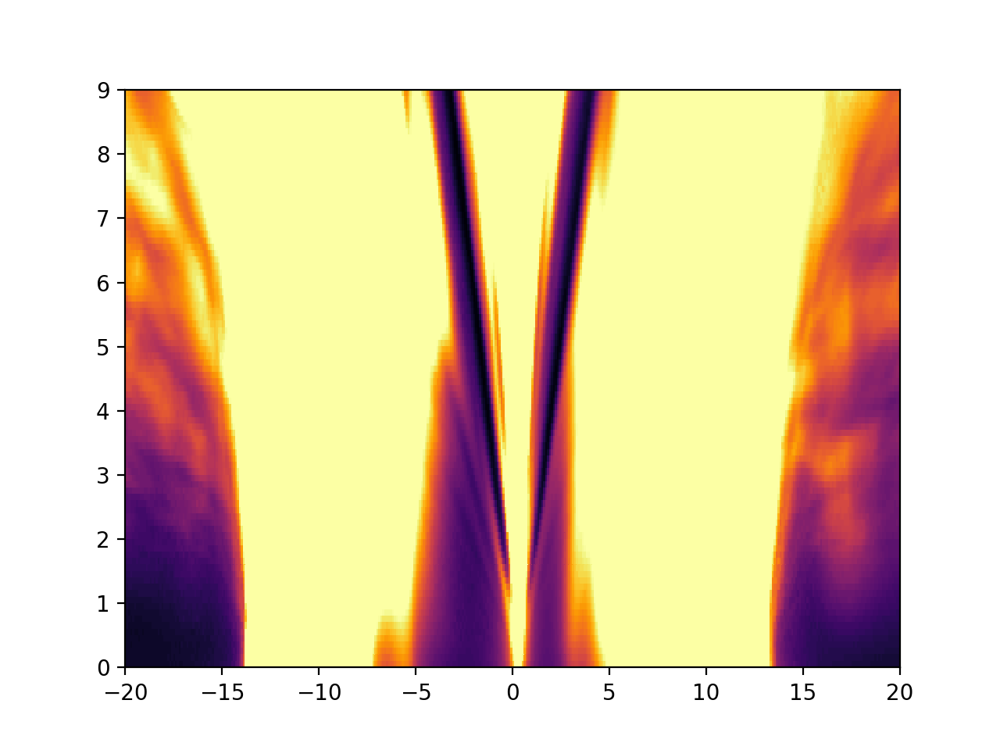

In [23]:
plt.figure()
plt.pcolormesh(gm05, bm05, Rm05, cmap='inferno', vmin=0, vmax=1*10**4)

In [24]:
# From the PPMS workbook, this fan diagram gives an angle of: (we can get the angle between the other sets of contacts from the other fan diagrams from around 10/13/2019 datasets, using the removeblacklines function)
print('Full filling voltage difference: 12.599772064981867')
print('theta:  1.1412979001466463')

Full filling voltage difference: 12.599772064981867
theta:  1.1412979001466463


## Triton 20-21 (PPMS 3-14) fan diagram

In [11]:
# use this to process the fridge fan diagram

def removeblacklines_2(R, gates, dg, zeropts):
    # zeropts = np.array([-11.6, -6.6, -1.6, 3.4, 8.4, 13.4])  # first find the points at zero field where this problem happens
    newgatepts = np.copy(zeropts)
    # dg = 0.1
    gmax = np.max(gates)
    gmin = np.min(gates)
    reachedge = np.zeros(len(zeropts))

    for j in range(R.shape[0]):
        print('Field #: ', j)
        if j > 0:
            newgatepts = newgatepts + dg
        for i, val in enumerate(newgatepts):
            if val > gmax:
                newgatepts[i] = gmin + dg
                val = newgatepts[i]
                reachedge[i] = 1

            # for each of these gate points, average the two points about the bad point 
            if reachedge[i] == 1:
                ind = npd.val_to_index([val], gates)[0]
                if ind == 0:
                    R[j, ind+1] = 0.5*(R[j, ind+2] + R[j, ind+3])
                    R[j, ind] = 0.5*(R[j, ind+1] + R[j, ind+2])
                elif ind == 1:
                    R[j, ind+1] = 0.5*(R[j, ind+2] + R[j, ind+3])
                    R[j, ind-1] = 0.5*(R[j, ind+1] + R[j, ind+2])
                    R[j, ind] = 0.5*(R[j, ind-1]+R[j, ind+1])
                elif ind == len(gates) - 2:
                    R[j, ind-1] = 0.5*(R[j, ind-2] + R[j, ind-3])
                    R[j, ind+1] = 0.5*(R[j, ind-1] + R[j, ind-2])
                    R[j, ind] = 0.5*(R[j, ind-1]+R[j, ind+1])
                elif ind == len(gates) - 1:
                    R[j, ind-1] = 0.5*(R[j, ind-2] + R[j, ind-3])
                    R[j, ind] = 0.5*(R[j, ind-1] + R[j, ind-2])
                else:
                    R[j, ind+1] = 0.5*(R[j, ind-1] + R[j, ind+2])
                    R[j, ind-1] = 0.5*(R[j, ind-2] + R[j, ind+1])
                    R[j, ind] = 0.5*(R[j, ind-1]+R[j, ind+1])
            else:
                ind = npd.val_to_index([val], gates)[0]
                R[j, ind] = 0.5*(R[j, ind-1]+R[j, ind+1])
    return R

In [12]:
zvals = np.array([-10.5333, -7.2, -3.8666, -0.53333, 2.8, 2.8 + (3+1/3), 2.8 + (3+1/3)*2, 2.8 + (3+1/3)*3, 2.8 + (3+1/3)*4])

In [13]:
dfanup = qc.load_data('data/2019-10-13/#005_M05_21-20and20-19_LandauFan_attempt3_14-15-09')
gfan = dfanup.srframe_volt_p1_set[0, :]
bfanup = dfanup.triton_field_set_stable_set[:-1]
Rfanup = dfanup.lockin865_X[:-1, :]/0.2e-9
Rfanup_rep = removeblacklines_2(Rfanup, gfan, 1/15, zvals)

Field #:  0
-10.53 is not a value in the array
Plotted -10.53 instead
-3.87 is not a value in the array
Plotted -3.87 instead
-0.53 is not a value in the array
Plotted -0.53 instead
6.13 is not a value in the array
Plotted 6.13 instead
9.47 is not a value in the array
Plotted 9.47 instead
16.13 is not a value in the array
Plotted 16.13 instead
Field #:  1
-10.47 is not a value in the array
Plotted -10.47 instead
-7.13 is not a value in the array
Plotted -7.13 instead
-3.80 is not a value in the array
Plotted -3.80 instead
-0.47 is not a value in the array
Plotted -0.47 instead
2.87 is not a value in the array
Plotted 2.87 instead
6.20 is not a value in the array
Plotted 6.20 instead
9.53 is not a value in the array
Plotted 9.53 instead
12.87 is not a value in the array
Plotted 12.87 instead
Field #:  2
-10.40 is not a value in the array
Plotted -10.40 instead
-7.07 is not a value in the array
Plotted -7.07 instead
-3.73 is not a value in the array
Plotted -3.73 instead
-0.40 is not a v

<IPython.core.display.Javascript object>


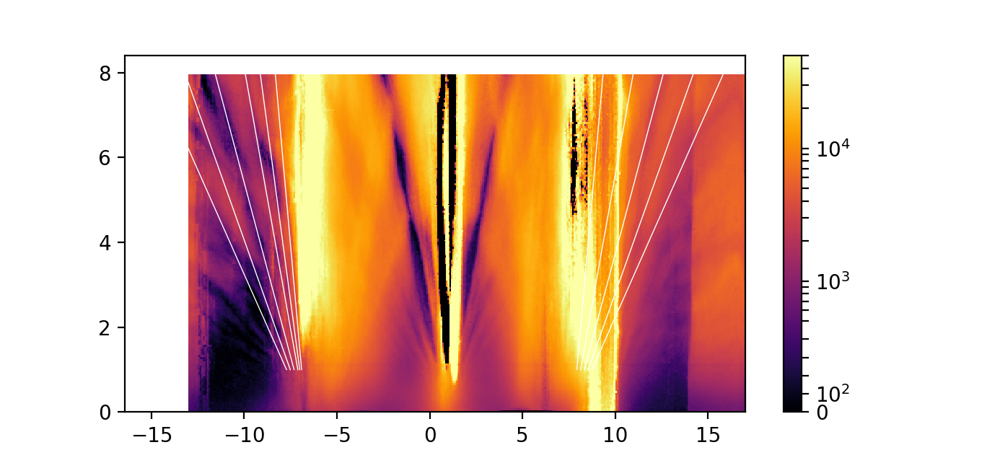

In [131]:
plt.figure()
plt.pcolormesh(gfan, bfanup, Rfanup, cmap='inferno', norm=SymLogNorm(500, vmin=0, vmax=0.5e5))
plt.colorbar()

Bl = 8
Bs = 1
vftry = -6.7
bfh = -sl0*vftry
for i in [-10, -8, -6, -4, -3, -2]:
    x = np.array([(Bs*i - bfh)/sl0, (Bl*i - bfh)/sl0])
    plt.plot(x, (x*sl0 + bfh)/i, color='white', lw=0.5)

vftry = V0 + np.abs(vftry) + 0.2
bfe = -sl0*vftry
for i in [2, 4, 6, 8, 10]:
    x = np.array([(Bs*i - bfe)/sl0, (Bl*i - bfe)/sl0])
    plt.plot(x, (x*sl0 + bfe)/i, color='white', lw=0.5)

In [86]:
print(len(bfanup))
bfanup[72]

160


3.6

In [87]:
72+80

152

<IPython.core.display.Javascript object>


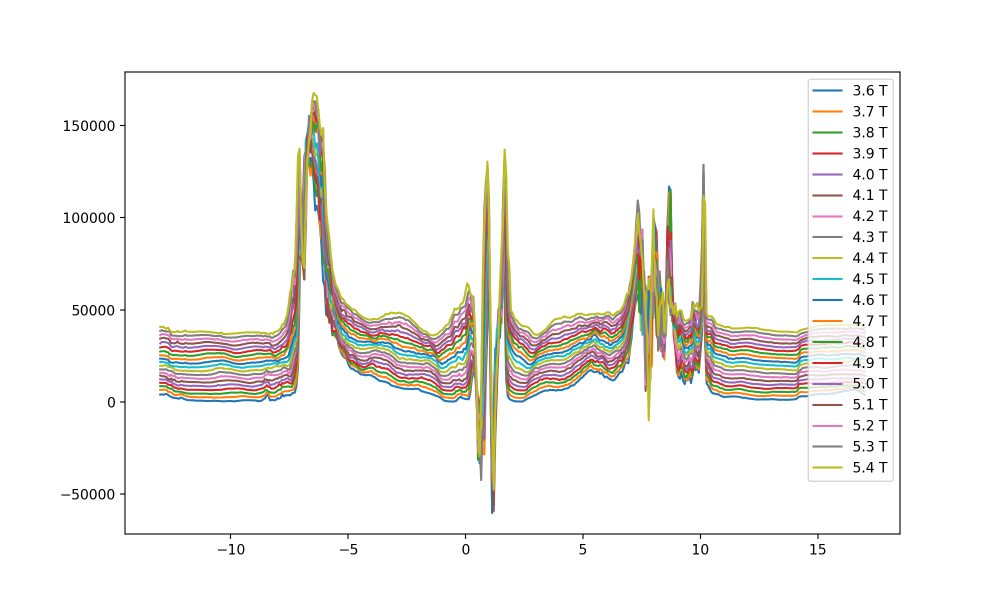

In [108]:
plt.figure(figsize=(10, 6))
for i in range(19):
    indx = 72 + 2*i
    b = bfanup[indx]
    plt.plot(gfan, Rfanup[indx, :] + 2000*i, label=f'{b} T')
    
plt.legend()

In [16]:
vfh1 = np.array([-8.76, -8.906, -9.06, -9.26, -9.45, -9.66, -9.77, -9.95, -10.72, -10.81, -11.015, -11.178, -11.42, -11.565, -11.671])
bfh1 = np.concatenate((np.linspace(3.6, 5, 8), np.linspace(6, 7.2, 7)))

vfh2 = np.array([-8, -8.018, -8.052, -8.103, -8.146, -8.146, -8.222, -8.239])
bfh2 = np.linspace(4.5, 5.2, 8)

vfh3 = np.array([-9.764, -9.866, -9.968, -10.096, -10.198])
bfh3 = np.linspace(5, 5.4, 5)

vfhs = np.concatenate((vfh1, vfh2, vfh3))
bfhs = np.concatenate((bfh1*-8, bfh2*-4, bfh3*-8))

slfh, bfh = np.polyfit(vfhs, bfhs, 1)

In [17]:
-bfh/slfh

-6.230310373784801

<IPython.core.display.Javascript object>


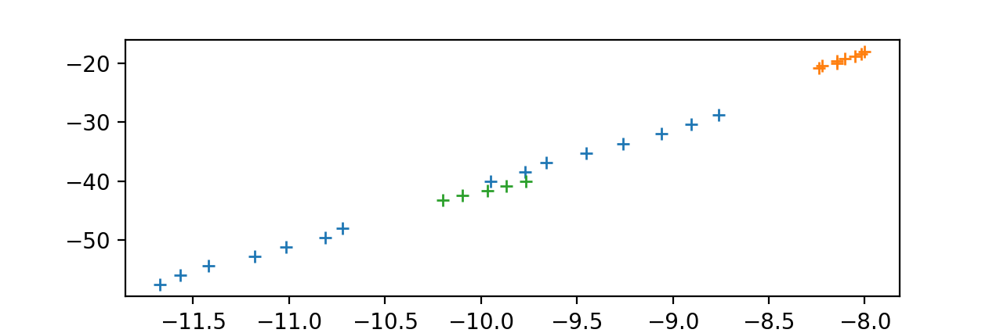

In [119]:
plt.figure()  # didn't work very well...
plt.plot(vfh1, bfh1*-8, '+')
plt.plot(vfh2, bfh2*-4, '+')
plt.plot(vfh3, bfh3*-8, '+')

In [18]:
V0f = -bfh/slfh

In [19]:
vf1 = np.array([10.585, 10.675, 10.794, 10.873, 10.964, 11.049, 11.117, 11.202, 11.309, 11.332, 11.354, 11.383, 11.428, 11.502, 11.620, 11.717, 11.818, 11.909, 12.022, 12.175])
bf1 = np.linspace(2.5, 7.25, len(vf1))

vf2 = np.array([10.432, 10.483, 10.517, 10.528, 10.556, 10.597, 10.6, 10.624, 10.647, 10.687, 10.777, 10.834, 10.873, 10.907, 11.015])
bf2 = np.linspace(3, 6.5, len(vf2))

vfs = np.concatenate((vf1, vf2))
bfs = np.concatenate((bf1*4, bf2*2))

slf, bf = np.polyfit(vfs, bfs, 1)
print(slf, bf)

13.962070050967203 -139.1284203734133


<IPython.core.display.Javascript object>


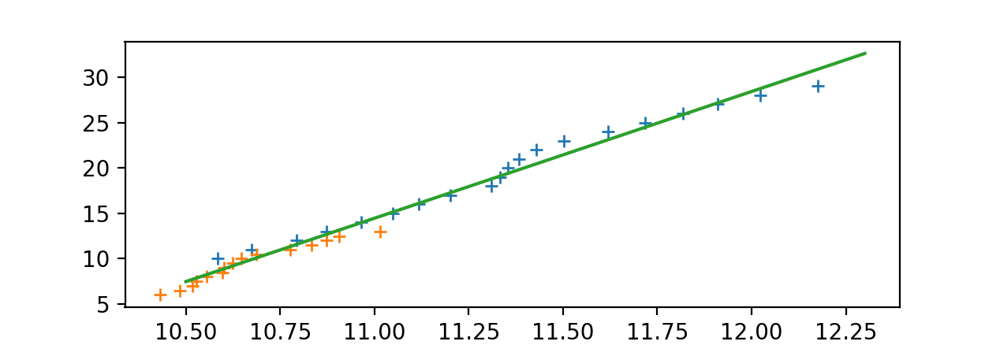

In [73]:
plt.figure()  # really didn't work very well. The slope is probably just the top of vf1, bf1
plt.plot(vf1, bf1*4, '+')
plt.plot(vf2, bf2*2, '+')
x = np.array([10.5, 12.3])
plt.plot(x, x*slf + bf)

In [20]:
v1 = np.array([0.257, 0.150, 0.096, 0.0298, -0.1259, -0.168, -0.228, -0.324, -0.473, -0.545, -0.611, -0.683, -0.761, -0.833, -0.904, -0.988, -1.08, -1.168, -1.246, -1.354])
b1 = np.linspace(1.5, 5.3, len(v1))

v2 = np.array([0.371, 0.335, 0.311, 0.263, 0.203, 0.168, 0.108, 0.078, 0.018, -0.018, -0.108, -0.138])  # actually the higher-slope shorter line (-2)
b2 = np.linspace(2.3, 4.5, len(v2))

v3 = np.array([-0.4227, -0.546, -0.720, -0.862, -1.032, -1.25, -1.396, -1.472])  # probably -8
b3 = np.linspace(1.5, 2.9, len(v3))

v4 = np.array([1.842, 1.901, 1.959, 2.014, 2.056, 2.089, 2.147, 2.206, 2.314, 2.381, 2.456, 2.573, 2.690, 2.77, 2.845, 2.916, 2.983])
b4 = np.linspace(2.1, 5.3, len(v4))

v5 = np.array([2.014, 2.164, 2.326, 2.464, 2.611, 2.757, 3.0, 3.216])
b5 = np.linspace(1.5, 2.9, len(v5))

vs = np.concatenate((v1, v2, v3, v4, v5))
bs = np.concatenate((b1*-4, b2*-2, b3*-8, b4*4, b5*8))

sl0, b0 = np.polyfit(vs, bs, 1)
print(sl0, b0)

9.83756187677379 -8.171778529025104


<IPython.core.display.Javascript object>


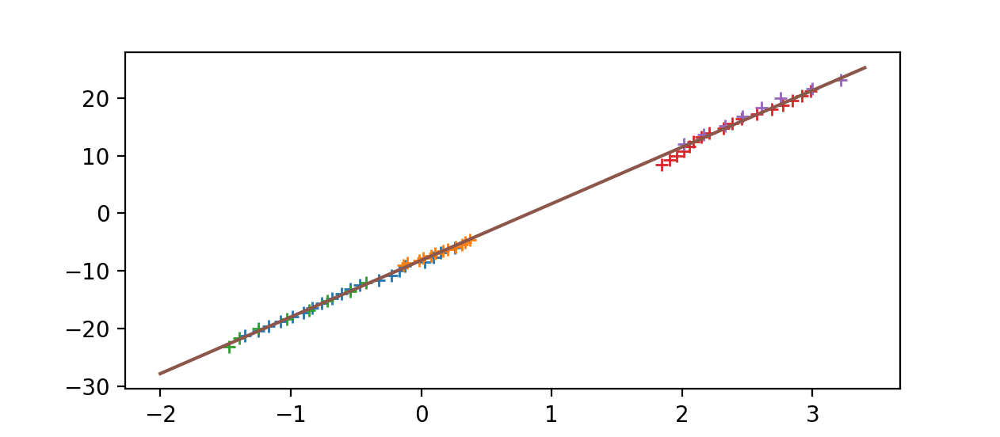

In [75]:
plt.figure()
plt.plot(v1, b1*-4, '+')
plt.plot(v2, b2*-2, '+')
plt.plot(v3, b3*-8, '+')
plt.plot(v4, b4*4, '+')
plt.plot(v5, b5*8, '+')
x = np.array([-2, 3.4])
plt.plot(x, x*sl0 + b0)

In [21]:
V0f = -6.7  # just ended up using the values plugged into the fan diagram
# V0 = -b0/sl0
C = sl0*1.602e-19**2/6.626e-34
dBN = 3*8.85e-12/C
V0 = -b0/sl0
print('effective capacitance: {:.4e}'.format(C))
print('effective hBN thickness: {:.1f} nm'.format(dBN*10**9))
print('V0: ', V0)
Vgatefull = V0 - V0f
print('Full filling voltage difference: {}'.format(Vgatefull))
nfull = (Vgatefull)*C/1.602e-19/10**4
print(nfull/10**12) #10**12 cm^-2
a = 0.246e-9

theta = np.sqrt(np.sqrt(3)*nfull*10**4*a**2/8)*180/np.pi
print('theta: ', theta)

effective capacitance: 3.8103e-04
effective hBN thickness: 69.7 nm
V0:  0.8306711186557765
Full filling voltage difference: 7.530671118655777
1.7911511598500156
theta:  0.8777264361192986


Contacts 20-19 now

In [14]:
R2019fan = npd.Rxxfromdata(dfanup, 0.2e-9, instrument='lockin830')[:-1, :]

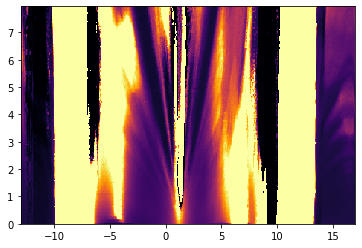

In [15]:
plt.figure()
plt.pcolormesh(gfan, bfanup, R2019fan, cmap='inferno', vmin=-1000, vmax=1e4)

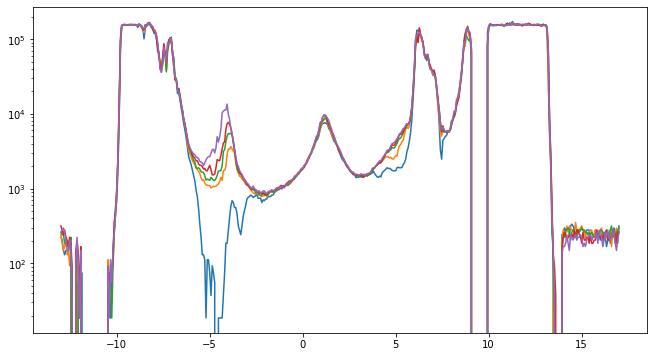

In [16]:
plt.figure(figsize=(11, 6))
for i in range(5):
    plt.semilogy(gfan, R2019fan[i, :])

In [17]:
bfanup[120]

6.0

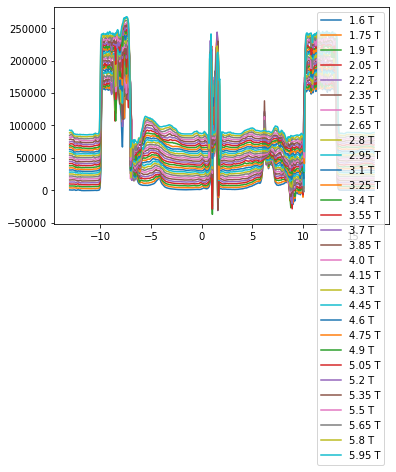

In [18]:
plt.figure()
for i in range(30):
    indx = 32 + i*3
    b = bfanup[indx]
    plt.plot(gfan, R2019fan[indx, :] + 3000*i, label=f'{b} T')
    
plt.legend()

In [19]:
v1f = np.array([14.08, 14.501, 14.844, 15.254, 15.52, 15.85])
b1f = np.linspace(3.4, 5.2, len(v1f))

v2f = np.array([14.65, 14.88, 15.13, 15.37, 15.66, 15.77])
b2f = np.linspace(3.1,3.85, len(v2f))

vfs = np.concatenate((v1f, v2f))
bfs = np.concatenate((b1f*6, b2f*8))

slf, bf = np.polyfit(vfs, bfs, 1)

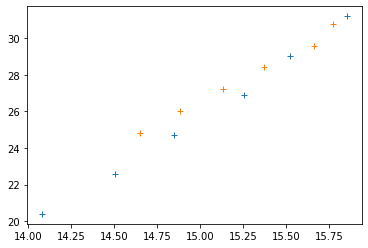

In [20]:
plt.figure()
plt.plot(v1f, b1f*6, '+')
plt.plot(v2f, b2f*8, '+')

In [21]:
v1h = np.array([0.642, 0.587, 0.542, 0.520, 0.498, 0.443, 0.398, 0.376, 0.188, 0.099, 0.055, -0.011, -0.066])
b1h = np.linspace(2.5, 6.1, len(v1h))

v2h = np.array([0.542, 0.454, 0.321, 0.199, 0.088, -0.044, -0.188, -0.365, -0.554, -0.675, -0.819])
b2h = np.linspace(1.6, 4.6, len(v2h))

v3h = np.array([-0.1107, -0.354, -0.609, -0.941, -1.24, -1.494])
b3h = np.linspace(1.6, 3.1, len(v3h))

v1e = np.array([2.125, 2.225, 2.302, 2.457, 2.568, 2.69, 2.812, 2.967, 3.122, 3.221])
b1e = np.linspace(1.9, 4.6, len(v1e))

vs0 = np.concatenate((v1h, v2h, v3h, v1e))
bs0 = np.concatenate((b1h*-2, b2h*-4, b3h*-8, b1e*4))

sl0, b0 = np.polyfit(vs0, bs0, 1)

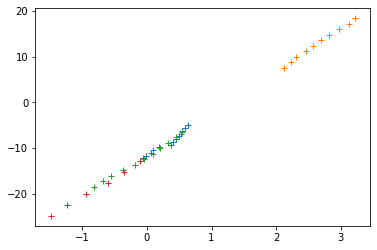

In [22]:
plt.figure()
plt.plot(v1h, b1h*-2, '+')
plt.plot(v1e, b1e*4, '+')
plt.plot(v2h, b2h*-4, '+')
plt.plot(v3h, b3h*-8, '+')

In [23]:
V0 = -b0/sl0
V0f = -bf/slf
print(V0, V0f)

1.250309168987657 10.609407631275328


(-11, 11)

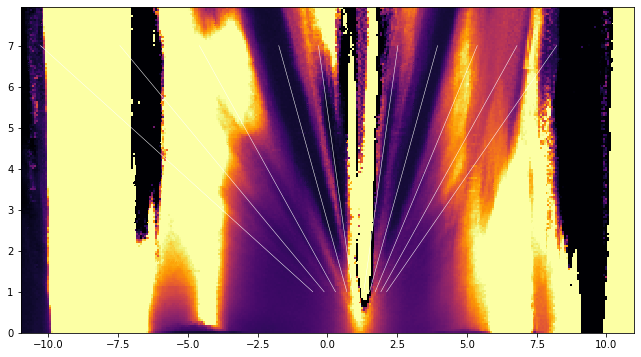

In [25]:
plt.figure(figsize=(11, 6))
plt.pcolormesh(gfan, bfanup, R2019fan, cmap='inferno', vmin=-1000, vmax=1e4)

sl0 = 9.83756187677379  # from the last area. use this one. it works better.
V0 = 1.250309168987657 - 0.15
Bl = 7
Bs = 1
b = -V0*sl0
for i in [-16, -12, -8, -4, -2, 2, 4, 6, 8, 10]:
    x = np.array([(Bs*i - b)/sl0, (Bl*i - b)/sl0])
    plt.plot(x, (x*sl0 + b)/i, color='white', lw=0.5)
    
V0f = 10.3
bf = -V0f*sl0
for i in [10, 12, 14, 18]:
    x = np.array([(Bs*i - bf)/sl0, (Bl*i - bf)/sl0])
    plt.plot(x, (x*sl0 + bf)/i, color='white', lw=0.5)
    
plt.xlim(-11, 11)

In [26]:
V0 = 1.250309168987657 - 0.15
V0f = 10.3
C = sl0*1.602e-19**2/6.626e-34
dBN = 3*8.85e-12/C
print('effective capacitance: {:.4e}'.format(C))
print('effective hBN thickness: {:.1f} nm'.format(dBN*10**9))
print('V0: ', V0)
Vgatefull = V0f - V0
print('Full filling voltage difference: {}'.format(Vgatefull))
nfull = (Vgatefull)*C/1.602e-19/10**4
print(nfull/10**12) #10**12 cm^-2
a = 0.246e-9

theta = np.sqrt(np.sqrt(3)*nfull*10**4*a**2/8)*180/np.pi
print('theta: ', theta)

effective capacitance: 3.8103e-04
effective hBN thickness: 69.7 nm
V0:  1.1003091689876572
Full filling voltage difference: 9.199690831012344
2.1881232950683733
theta:  0.970127810366781


Either it's this: 0.97 degrees

In [27]:
nugate2019 = np.interp(gfan, [V0 - Vgatefull*8/4, V0 + Vgatefull*8/4], [-8, 8])

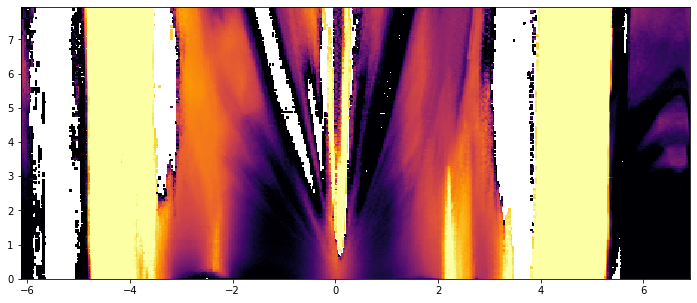

In [28]:
plt.figure(figsize=(12, 5))
plt.pcolormesh(nugate2019, bfanup, R2019fan, cmap='inferno', norm=npd.DivLogNorm(0.4, 1000, 1e5))

Or it's this: 1.03 degrees (this lines up with the +/- half filling insulators better.

In [29]:
Vgatefull = 10.4
nfull = (Vgatefull)*C/1.602e-19/10**4
print(nfull/10**12) #10**12 cm^-2
a = 0.246e-9

theta = np.sqrt(np.sqrt(3)*nfull*10**4*a**2/8)*180/np.pi
print('theta: ', theta)

2.473613807976951
theta:  1.0314757162607469


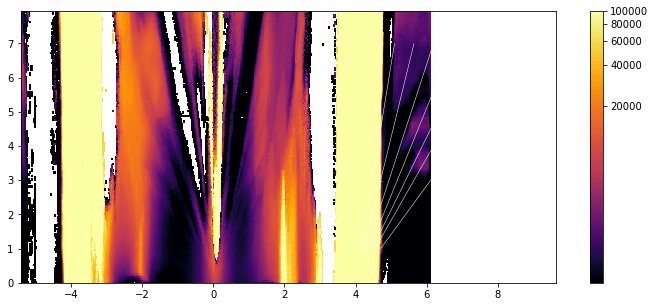

In [32]:
nugate2019 = np.interp(gfan, [V0 - Vgatefull*8/4, V0 + Vgatefull*8/4], [-8, 8])
plt.figure(figsize=(12, 5))
plt.pcolormesh(nugate2019, bfanup, R2019fan, cmap='inferno', norm=npd.DivLogNorm(0.4, 1000, 1e5))
plt.colorbar()


slfill = sl0*Vgatefull/4

V0f = 4
bf = -4*slfill
for i in [4, 6, 8, 10, 12, 14, 18]:
    x = np.array([(Bs*i - bf)/slfill, (Bl*i - bf)/slfill])
    plt.plot(x, (x*slfill + bf)/i, color='white', lw=0.5)

In [36]:
figfile

'Figures/191004_M05_M08_M09_SC/'

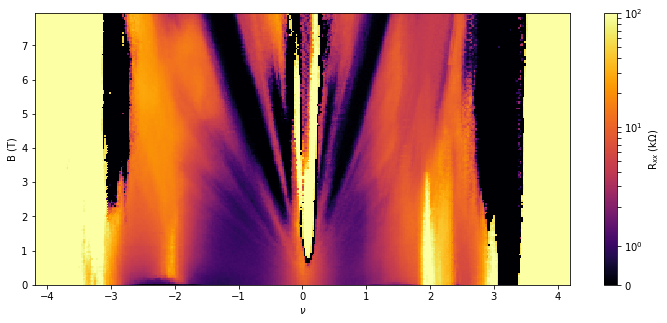

In [37]:
plt.figure(figsize=(12, 5))
plt.pcolormesh(nugate2019, bfanup, R2019fan/1000, cmap='inferno', norm=npd.DivSymLogNorm(2, 0.4, vmin=0, vmax=100))
plt.xlim(-4.2, 4.2)
plt.xlabel('$\\nu$')
plt.ylabel('B (T)')
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
# plt.savefig(figfile + 'M05_19-20_LandauFan.png', dpi=300, bbox_inches='tight')